In [1]:
here::i_am("01_create_arrow.R")
source(here::here("settings.R"))
source(here::here("load_archr.R"))
library(viridis)

addArchRThreads(1)

here() starts at /rds/project/rds-SDzz0CATGms/users/bt392/04_Rabbit_ATAC_final/rerun/code

Setting default number of Parallel threads to 1.

Setting addArchRVerbose = FALSE

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
       

In [5]:
#### Read RNA ####
io$RNA_in <- file.path(io$basedir,"RNA/RangedSummarizedExperiment.rds")
sceRNA = readRDS(io$RNA_in)

# Update celltypes
new_meta = fread(file.path(io$basedir,"RNA/annotations_08_03_22.tsv"), header=TRUE) %>%
    setnames(c('V1', 'assigned_celltype'), c('cell', 'celltype')) %>%
     .[,c('cell', 'celltype')] %>%
     .[order(match(cell, colnames(sceRNA))),] 

new_meta$stage = colData(sceRNA)$stage
colData(sceRNA) = new_meta %>% tibble::column_to_rownames('cell') %>% DataFrame

In [24]:
unique(new_meta$celltype)

[1] "Epiblast"                             
 [2] "Hypoblast"                            
 [3] "Primitive Streak"                     
 [4] "Trophoblast"                          
 [5] "Nascent mesoderm"                     
 [6] "Haematoendothelial progenitors"       
 [7] "Anterior Primitive Streak"            
 [8] "Parietal YS endoderm"                 
 [9] "PGC"                                  
[10] "Allantois endothelium"                
[11] "Visceral endoderm"                    
[12] "Amnion 1"                             
[13] "Cytotrophoblast"                      
[14] "Definitive Endoderm"                  
[15] "Cardiopharyngeal progenitors"         
[16] "Embryo proper endothelium"            
[17] "Visceral YS endoderm 2"               
[18] "Gut endoderm"                         
[19] "EMP"                                  
[20] "Placodal ectoderm"                    
[21] "Amnion 2"                             
[22] "Lateral plate mesoderm"               
[23] "Notochord"                            
[24] "NMPs"                                 
[25] "Non-neural ectoderm 4"                
[26] "Pharyngeal endoderm"                  
[27] "Dermomyotome"                         
[28] "MEP"                                  
[29] "Cranial mesoderm"                     
[30] "Visceral YS endoderm"                 
[31] "Caudal mesoderm"                      
[32] "Mesenchyme"                           
[33] "Anterior somitic tissues"             
[34] "Forebrain"                            
[35] "Anterior cardiopharyngeal progenitors"
[36] "Cardiomyocytes FHF 1"                 
[37] "Syncytiotrophoblast"                  
[38] "Syncytiotrophoblast progenitors"      
[39] "Venous endothelium"                   
[40] "Erythroid"                            
[41] "Hindbrain"                            
[42] "Mesothelium"                          
[43] "NMPs/Mesoderm-biased"                 
[44] "Cardiomyocytes FHF 2"                 
[45] "YS endothelium"                       
[46] "Sclerotome"                           
[47] "Presomitic mesoderm"                  
[48] "Spinal cord"                          
[49] "Allantois"                            
[50] "Endocardium"                          
[51] "Somitic mesoderm"                     
[52] "Epicardium"                           
[53] "Posterior somitic tissues"            
[54] "Midbrain"                             
[55] "Gut tube"                             
[56] "Nephron progenitors"                  
[57] "Amnion 3"                             
[58] "Differentiating neurons"              
[59] "Limb mesoderm"                        
[60] "Thyroid primordium"                   
[61] "Floor plate"                          
[62] "Migratory neural crest"               
[63] "Non-neural ectoderm 2"                
[64] "Cranial neural crest"                 
[65] "Roof plate"                           
[66] "Megakariocytes"                       
[67] "Mesothelium-endothelium/Masked"

In [16]:
Mapping_matrix = function(matrix, dims, features){ # MATRIX = Which matrix to use for dim reduction in mapping
    args = list()
    args$Matrix = matrix
    
    # I/O
    io$outdir <- file.path(io$output.directory,"mapping")
    dir.create(file.path(io$outdir), showWarnings = FALSE)
    
    #### Mapping function ######
    mapping = function(stage_select){
        # Subset RNA
               
        if(stage_select=='GD9_ExE'){ # Map GD9_ExE to normal GD9
            RNA_stage = sceRNA[,colData(sceRNA)$stage == 'GD9'] # for RangedSummarizedExperiment object
        } else{
            RNA_stage = sceRNA[,colData(sceRNA)$stage == stage_select] # for RangedSummarizedExperiment object
        }
        
        print(stage_select)
            
        
        # Subset ATAC 
        keep = rownames(ArchRProject@cellColData[ArchRProject@cellColData$stage==stage_select,]) # per stage instead of stage_mapping which includes ExE for GD9
        ATAC_stage = ArchRProject[keep]

        # ATAC dim redu
        # Iterative LSI: two iterations
        ATAC_stage <- addIterativeLSI(
          ArchRProj = ATAC_stage,
          useMatrix = args$Matrix, 
          dimsToUse = 1:dims,
          name = "IterativeLSI", 
          firstSelection = "Top",
          depthCol = "nFrags",
          iterations = 2, 
          saveIterations = FALSE,
          varFeatures = features, 
          force = TRUE
        )

        # Add clusters
        ATAC_stage <- addClusters(input = ATAC_stage,  
                                 reducedDims = "IterativeLSI",
                                 resolution = 1.5, 
                                 force=TRUE)
        clusters = paste0(stage_select, '_', getCellColData(ATAC_stage)$Clusters)

        # Add imputation 
        ATAC_stage <- addImputeWeights(ATAC_stage)

        # Integrate
        ATAC_stage <- addGeneIntegrationMatrix(
            ArchRProj = ATAC_stage, 
            useMatrix = "GeneScoreMatrix",
            matrixName = paste0("GeneIntegrationMatrix_", args$Matrix),
            reducedDims = "IterativeLSI",
            seRNA = RNA_stage,
            addToArrow = TRUE,
            force= TRUE,
            groupRNA = "celltype",
            nameCell = paste0("predictedCell_Un_", args$Matrix),
            nameGroup = paste0("predictedGroup_celltype_", args$Matrix),
            nameScore = paste0("predictedScore_celltype_", args$Matrix))

        # Extract mapping
        meta = as.data.frame(ATAC_stage@cellColData[, c(paste0("predictedCell_Un_", args$Matrix), paste0("predictedGroup_celltype_", args$Matrix), paste0("predictedScore_celltype_", args$Matrix))])
        meta$stage_clusters = clusters
        meta$cell = rownames(meta)
        return(meta)
    }

    mapped = suppressWarnings(lapply(unique(ArchRProject@cellColData$stage), mapping)) # for RangedSummarizedExperiment object
    mapped = rbindlist(mapped)

    write.csv(mapped, file.path(io$outdir, paste0('celltype_mapping_', args$Matrix, '.csv')), row.names=FALSE)

    ArchRProject@cellColData = cbind(ArchRProject@cellColData, mapped)
    return(ArchRProject)
}

In [17]:
ArchRProject = Mapping_matrix(matrix='PeakMatrix', dims=45, features=55000)

[1] "GD7"


Dropping ImputeWeights Since You Are Subsetting Cells! ImputeWeights is a cell-x-cell Matrix!

Checking Inputs...

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 9954
Number of edges: 448359

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8011
Number of communities: 20
Elapsed time: 0 seconds


Getting ImputeWeights

Length of unique values greater than palette, interpolating..

Overriding previous entry for predictedCell_Un_PeakMatrix

Overriding previous entry for predictedGroup_celltype_PeakMatrix

Overriding previous entry for predictedScore_celltype_PeakMatrix



[1] "GD8"


Dropping ImputeWeights Since You Are Subsetting Cells! ImputeWeights is a cell-x-cell Matrix!

Checking Inputs...

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 8965
Number of edges: 479814

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8563
Number of communities: 21
Elapsed time: 0 seconds


Getting ImputeWeights

Length of unique values greater than palette, interpolating..

Overriding previous entry for predictedCell_Un_PeakMatrix

Overriding previous entry for predictedGroup_celltype_PeakMatrix

Overriding previous entry for predictedScore_celltype_PeakMatrix



[1] "GD9_ExE"


Dropping ImputeWeights Since You Are Subsetting Cells! ImputeWeights is a cell-x-cell Matrix!

Checking Inputs...

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 1709
Number of edges: 90153

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.7002
Number of communities: 11
Elapsed time: 0 seconds


Getting ImputeWeights

Length of unique values greater than palette, interpolating..

Overriding previous entry for predictedCell_Un_PeakMatrix

Overriding previous entry for predictedGroup_celltype_PeakMatrix

Overriding previous entry for predictedScore_celltype_PeakMatrix



[1] "GD9"


Dropping ImputeWeights Since You Are Subsetting Cells! ImputeWeights is a cell-x-cell Matrix!

Checking Inputs...

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 16529
Number of edges: 799549

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8544
Number of communities: 27
Elapsed time: 2 seconds


2 singletons identified. 25 final clusters.

Getting ImputeWeights

Getting ImputeWeights

Length of unique values greater than palette, interpolating..

Length of unique values greater than palette, interpolating..

Overriding previous entry for predictedCell_Un_PeakMatrix

Overriding previous entry for predictedGroup_celltype_PeakMatrix

Overriding previous entry for predictedScore_celltype_PeakMatrix



In [18]:
keep = c('Trophoblast', 
         'Cytotrophoblast', 
         'Syncytiotrophoblast', 
         'Syncytiotrophoblast progenitors')
ArchRProject = ArchRProject[ArchRProject@cellColData$predictedGroup_celltype_PeakMatrix %in% keep]

Dropping ImputeWeights Since You Are Subsetting Cells! ImputeWeights is a cell-x-cell Matrix!



In [19]:
dim_redu = function(project = ArchRProject, matrix='PeakMatrix', ndims=20, nfeatures=25000, n_neighbors=25,min_dist=0.7 ){
    seed = 42

    # Options
    opts = list()
    opts$lsi.iterations = 2
    opts$lsi.cluster.resolution = 0.5

    ###########################
    ## Latent Semantic Index ##
    ###########################

    # Iterative LSI: two iterations
    project <- addIterativeLSI(
      ArchRProj = project,
      useMatrix = matrix, 
      name = paste0(matrix, '_tropho'), 
      dimsToUse = 1:ndims,
      firstSelection = "Top",
      depthCol = "nFrags",
      iterations = opts$lsi.iterations, 
      saveIterations = FALSE,
      varFeatures = nfeatures, 
      force = TRUE
    )

    #Add clusters
    project <- addClusters(input = project,  
                             reducedDims = paste0(matrix, '_tropho'),
                             resolution = opts$lsi.cluster.resolution, 
                             force=TRUE)

    project <- addUMAP(
      ArchRProj = project, 
      reducedDims = paste0(matrix, '_tropho'),
      name = paste0("UMAP_tropho_", matrix),
      metric = "cosine",
      nNeighbors = n_neighbors, 
      minDist = min_dist, 
      seed = seed,
      saveModel = FALSE,
      force = TRUE)

    p =  plotEmbedding(project, 
        embedding=paste0("UMAP_tropho_", matrix),
        colorBy = "cellColData", 
        name = "predictedGroup_celltype_PeakMatrix")+ theme_void() + theme(plot.margin=grid::unit(c(0,0,0,0), "mm"))
    print(p)
        return(project)
}

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 2771
Number of edges: 157578

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8382
Number of communities: 9
Elapsed time: 0 seconds


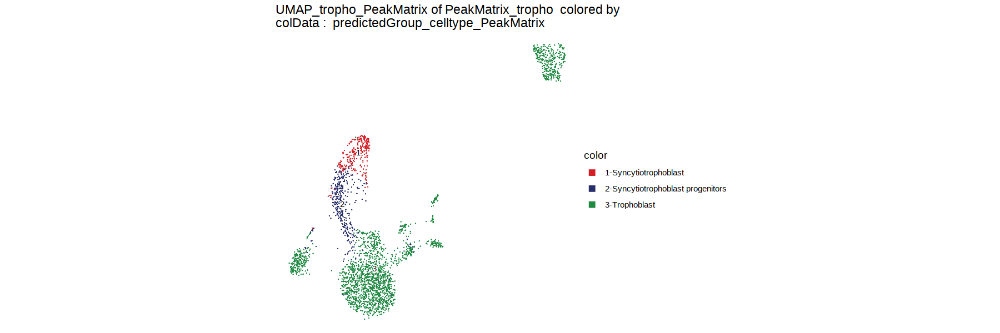

In [20]:
ArchRProject = suppressMessages(dim_redu(ndims=35, nfeatures=15000, n_neighbors=45,min_dist=0.3 ))

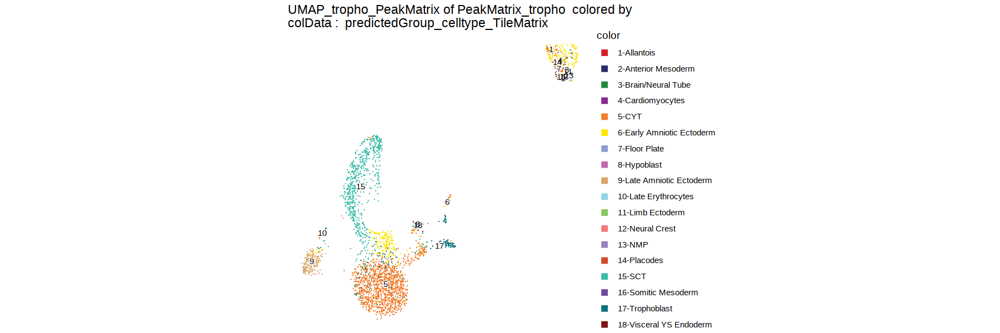

In [23]:
plotEmbedding(ArchRProject, 
              embedding=paste0("UMAP_tropho_PeakMatrix"),
              colorBy = "cellColData", 
            name = "predictedGroup_celltype_TileMatrix")+ theme_void() + theme(plot.margin=grid::unit(c(0,0,0,0), "mm"))

In [8]:
matrix = 'PeakMatrix'

# Add imputation 
ArchRProject <- addImputeWeights(ArchRProject, 
                                reducedDims = matrix)

Warning message in sprintf("Completed Getting Magic Weights!", round(object.size(weightList)/10^9, :
“one argument not used by format 'Completed Getting Magic Weights!'”


In [10]:
addArchRThreads(1)

Setting default number of Parallel threads to 1.



In [11]:
# Integrate
ArchRProject <- addGeneIntegrationMatrix(
    ArchRProj = ArchRProject, 
    useMatrix = "GeneScoreMatrix",
    matrixName = paste0("GeneIntegrationMatrix_", matrix),
    reducedDims =  matrix,
    seRNA = sceRNA,
    addToArrow = TRUE,
    force= TRUE,
    groupRNA = "celltype",
    nameCell = paste0("predictedCell_Un_tropho_old"),
    nameGroup = paste0("celltype_tropho_old"),
    nameScore = paste0("score_tropho_old"))

Warning message:
“Non-unique features (rownames) present in the input matrix, making unique”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message in sprintf("Completed Getting Magic Weights!", round(object.size(weightList)/10^9, :
“one argument not used by format 'Completed Getting Magic Weights!'”
Getting ImputeWeights

Warning message in sprintf("Completed Getting Magic Weights!", round(object.size(weightList)/10^9, :
“one argument not used by format 'Completed Getting Magic Weights!'”
Getting ImputeWeights

Warning message in sprintf("Completed Getting Magic Weights!", round(object.size(weightList)/10^9, :
“one argument not used by format 'Completed Getting Magic Weights!'”
Getting ImputeWeights

Warning message in sprintf("Completed Getting Magic Weights!", round(object.size(weightList)/10^9, :
“one argument not used by format 'Completed Getting Magic Weights!'”
Getting ImputeWeights

Length of unique values greater than palett

Length of unique values greater than palette, interpolating..



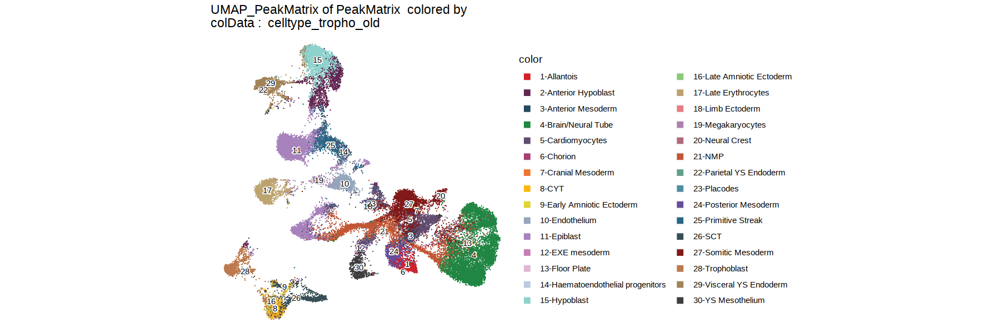

In [13]:
plotEmbedding(
  ArchRProj = ArchRProject,
  embedding = 'UMAP_PeakMatrix',
  colorBy = "cellColData",
  name = paste0("celltype_tropho_old")) + theme_void()

In [14]:
#ArchRProject = ArchRProject[ArchRProject@cellColData$celltype_tropho_old %in% c('Trophoblast', 'CYT', 'SCT')]
ArchRProject = ArchRProject[ArchRProject@cellColData$predictedGroup_celltype_TileMatrix %in% c('Trophoblast', 'CYT', 'SCT')]

Dropping ImputeWeights Since You Are Subsetting Cells! ImputeWeights is a cell-x-cell Matrix!



# Subset

Rather than only isolating cells labelled trophoblast, SCT, or CYT, I isolate all cells that are grouped in that area of the UMAP

In [2]:
meta = data.frame(ArchRProject@cellColData)

In [3]:
unique(meta$celltype_v1)

[1] "Parietal YS endoderm"            "Hypoblast"                      
 [3] "Trophoblastic knobs"             "Nascent mesoderm"               
 [5] "Epiblast"                        "Haematoendothelial progenitors" 
 [7] "Definitive Endoderm_?"           "EMP_?"                          
 [9] "Visceral endoderm"               "Trophoblast"                    
[11] "Syncytiotrophoblast"             "Cardiomyocytes FHF 1_?"         
[13] "Venous endothelium"              "Syncytiotrophoblast progenitors"
[15] "Epiblast_?"                      "unknown"                        
[17] "Cranial mesoderm_?"              "Presomitic mesoderm_?"          
[19] "Lateral plate mesoderm"          "NMPs/Mesoderm-biased"           
[21] "Gut endoderm"                    "Mesenchyme"                     
[23] "Hindbrain"                       "Erythroid"                      
[25] "Visceral YS endoderm"            "Megakariocytes"                 
[27] "YS endothelium"                  "Mesothelium"                    
[29] "Visceral YS endoderm_?"          "EMP"                            
[31] "Spinal cord_?"                   "Sclerotome"                     
[33] "Forebrain"                       "Sclerotome_?"                   
[35] "Allantois"                       "Midbrain_?"                     
[37] "Forebrain_?"                     "Cranial neural crest"           
[39] "Differentiating neurons"         "Caudal mesoderm_?"              
[41] "Cardiomyocytes FHF 2"            "Hindbrain_?"

In [4]:
#keep_celltypes = c('Trophoblast', 'CYT', 'SCT')
keep_celltypes = c('Trophoblastic knobs', 'Trophoblast', 'Syncytiotrophoblast', 'Syncytiotrophoblast progenitors')

In [5]:
keep_cells = meta[meta$celltype_v1 %in% keep_celltypes, 'cell']

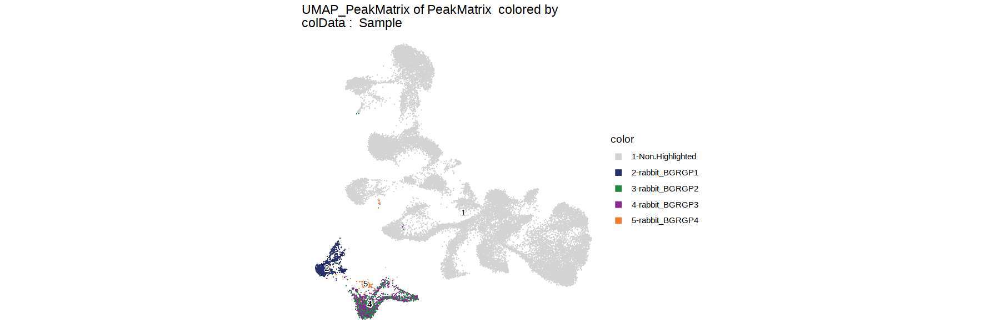

In [6]:
plotEmbedding(
  ArchRProj = ArchRProject,
  embedding = "UMAP_PeakMatrix",
  highlightCells = keep_cells) + theme_void()

# Select cells

In [7]:
keep_cells = ArchRProject@cellColData[ArchRProject@cellColData$celltype_v1 %in% keep_celltypes,]$cell

In [8]:
ArchRProject = subsetArchRProject(
  ArchRProj = ArchRProject,
  cells = keep_cells,
  outputDirectory = "Trophoblast_2",
  dropCells = TRUE,
  logFile = NULL,
  threads = getArchRThreads(),
  force = TRUE
)

Dropping ImputeWeights Since You Are Subsetting Cells! ImputeWeights is a cell-x-cell Matrix!

Copying ArchRProject to new outputDirectory : /rds/project/rds-SDzz0CATGms/users/bt392/04_Rabbit_ATAC_final/rerun/ArchR/Trophoblast_2

Copying Arrow Files...

Getting ImputeWeights

No imputeWeights found, returning NULL

Copying Other Files...

Copying Other Files (1 of 12): Annotations

Copying Other Files (2 of 12): Background-Peaks.rds

Copying Other Files (3 of 12): GroupBigWigs

Copying Other Files (4 of 12): GroupCoverages

Copying Other Files (5 of 12): IterativeLSI

Copying Other Files (6 of 12): LSI

Copying Other Files (7 of 12): Peak2GeneLinks

Copying Other Files (8 of 12): PeakCalls

Copying Other Files (9 of 12): PeakMatrix

Copying Other Files (10 of 12): Plots

Copying Other Files (11 of 12): RNAIntegration

Copying Other Files (12 of 12): TileMatrix

Saving ArchRProject...

Loading ArchRProject...

Successfully loaded ArchRProject!


                                         

# Load Trophoblast trajectory

In [9]:
source(here::here("settings.R"))
ArchRProject <- loadArchRProject(file.path(io$basedir, 'ArchR/Trophoblast_2'))
library(viridis)

# I/O
io$plot.trophoblast = file.path(io$basedir, 'ArchR/Trophoblast_2/plots')
dir.create(io$plot.trophoblast, showWarnings = FALSE)


Setting default number of Parallel threads to 1.

Setting addArchRVerbose = FALSE

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\__

In [10]:
addArchRThreads(12)

Setting default number of Parallel threads to 12.



In [11]:
# peaks = getPeakSet(ArchRProject)
# peaks = peaks[names(peaks) %in% unique(ArchRProject@cellColData$Clusters_TileMatrix),]
# ArchRProject = addPeakSet(ArchRProject, peakSet=peaks, force=TRUE)
# # Peakmatrix got lost somewhere in the process
# ArchRProject = addPeakMatrix(
#   ArchRProj = ArchRProject)

In [12]:
dim_redu = function(project = ArchRProject, matrix='PeakMatrix', ndims=20, nfeatures=25000, n_neighbors=25,min_dist=0.7 ){
    seed = 42

    # Options
    opts = list()
    opts$lsi.iterations = 2
    opts$lsi.cluster.resolution = 0.5

    ###########################
    ## Latent Semantic Index ##
    ###########################

    # Iterative LSI: two iterations
    project <- addIterativeLSI(
      ArchRProj = project,
      useMatrix = matrix, 
      name = paste0(matrix, '_tropho'), 
      dimsToUse = 1:ndims,
      firstSelection = "Top",
      depthCol = "nFrags",
      iterations = opts$lsi.iterations, 
      saveIterations = FALSE,
      varFeatures = nfeatures, 
      force = TRUE
    )

    #Add clusters
    project <- addClusters(input = project,  
                             reducedDims = paste0(matrix, '_tropho'),
                             resolution = opts$lsi.cluster.resolution, 
                             force=TRUE)

    project <- addUMAP(
      ArchRProj = project, 
      reducedDims = paste0(matrix, '_tropho'),
      name = paste0("UMAP_tropho_", matrix),
      metric = "cosine",
      nNeighbors = n_neighbors, 
      minDist = min_dist, 
      seed = seed,
      saveModel = FALSE,
      force = TRUE)

    p =  plotEmbedding(project, 
        embedding=paste0("UMAP_tropho_", matrix),
        colorBy = "cellColData", 
        name = "celltype_v1")+ theme_void() + theme(plot.margin=grid::unit(c(0,0,0,0), "mm"))
    print(p)
        return(project)
}

Warning message:
“package ‘Seurat’ was built under R version 4.1.2”


Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 3190
Number of edges: 509920

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8137
Number of communities: 6
Elapsed time: 0 seconds


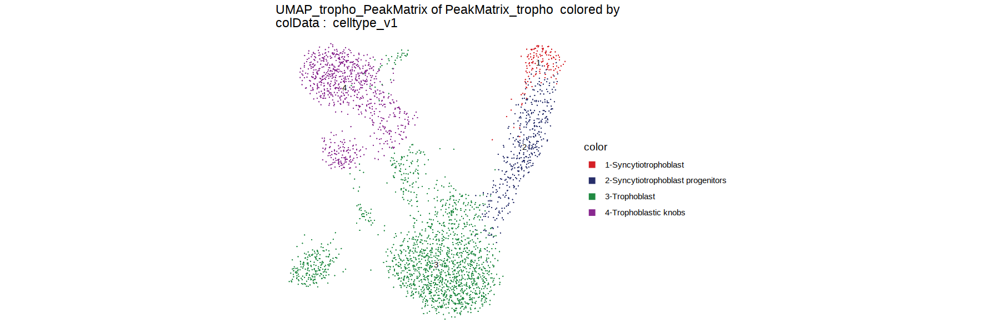

In [13]:
ArchRProject = suppressMessages(dim_redu(ndims=100, nfeatures=25000))

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 3190
Number of edges: 119810

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8790
Number of communities: 9
Elapsed time: 0 seconds


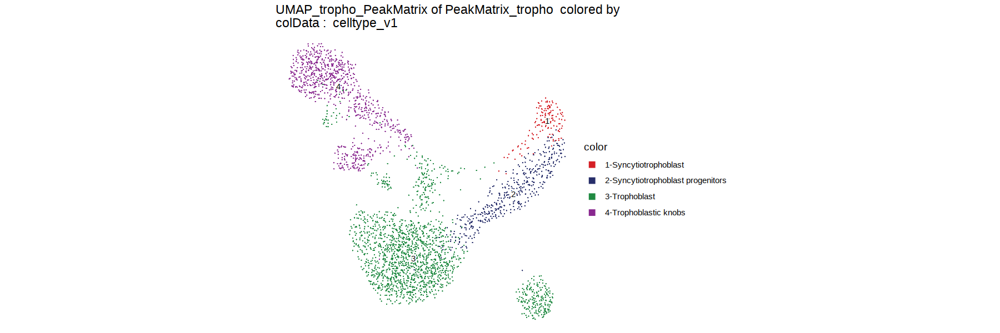

In [14]:
ArchRProject = suppressMessages(dim_redu(ndims=15, nfeatures=10000))

### Plot known marker genes from Mai-Linh

https://docs.google.com/spreadsheets/d/1-nMnH8_2x3MaxPYU9OQUiVp3oxIRTUS764uALj5yWUA/edit?usp=sharing

In [15]:
library(patchwork)

In [20]:
# Get gene score genes
score_genes = getFeatures(
  ArchRProj = ArchRProject,
  useMatrix = "GeneScoreMatrix")
score_genes = lapply(strsplit(score_genes, ":"), `[`, 2)
# Get gene integration genes
integration_genes = getFeatures(
  ArchRProj = ArchRProject,
  useMatrix = "GeneIntegrationMatrix_PeakMatrix")
integration_genes = lapply(strsplit(integration_genes, ":"), `[`, 2)


plot_marker_gene = function(gene){
    
    # Plot gene score
    if(gene %in% score_genes){
        p1 = plotEmbedding(
                ArchRProj = ArchRProject, 
                            colorBy = "GeneScoreMatrix", 
                            embedding = 'UMAP_tropho_PeakMatrix',
                            name = gene) + 
                theme_void() + 
                theme(legend.title = element_blank()) + 
                ggtitle(paste0(gene, '- Gene Score'))
    }else{p1 = ggplot() + theme_void() + ggtitle(gene)}
    
    # Plot gene integration whole atlas
    if(gene %in% integration_genes){
    p2 = plotEmbedding(
                ArchRProj = ArchRProject, 
                            colorBy = "GeneIntegrationMatrix_PeakMatrix", 
                            embedding = 'UMAP_tropho_PeakMatrix',
                            name = gene) + 
                theme_void() + 
                theme(legend.title = element_blank()) + 
                ggtitle('Gene Integration (whole atlas)')
    }else{p2 = ggplot() + theme_void()} 
    
    # Plot Motif
    markerMotifs <- grep("z:", getFeatures(ArchRProject, select = gene, useMatrix = "MotifMatrix"), value = TRUE)
    if(length(markerMotifs>0)){
    p4 = plotEmbedding(
                ArchRProj = ArchRProject, 
                            colorBy = "MotifMatrix", 
                            embedding = 'UMAP_tropho_PeakMatrix',
                            name = markerMotifs[1]) + 
                theme_void() + 
                theme(legend.title = element_blank()) + 
                ggtitle('Motif Accessibility')
    }else{p4 = ggplot() + theme_void()}   
    
    return(p1+p2+p4)
}

In [21]:
marker_genes = c('AQP2',
                'AQP3',
                'VTCN1',
                'PGF',
                'LUM',
                'COL1A1',
                'CDH3',
                'GABRP',
                'POSTN',
                'COL1A2',
                'STC1',
                'ORY',
                'GATA3',
                'HAND1',
                'GATA2',
                'ENSOCUG00000029640',
                'ENSOCUG00000013783',
                'HOXA11',
                'DPPA3',
                'ENSOCUG00000010123',
                'CYP19A1',
                'EFNA1',
                'TEAD4',
                'GCM1',
                'CDH3',
                'TP63',
                'TFAP2A',
                'TFAP2C',
                'CD47',
                'ENSOCUG00000003966',
                'ITGA5',
                'KLF6'
                 )

pdf(file.path(io$plot.trophoblast, 'marker_genes.pdf'), width=8, height=8)
    suppressMessages(lapply(marker_genes, plot_marker_gene))
dev.off()

[[1]]

[[2]]

[[3]]

[[4]]

[[5]]

[[6]]

[[7]]

[[8]]

[[9]]

[[10]]

[[11]]

[[12]]

[[13]]

[[14]]

[[15]]

[[16]]

[[17]]

[[18]]

[[19]]

[[20]]

[[21]]

[[22]]

[[23]]

[[24]]

[[25]]

[[26]]

[[27]]

[[28]]

[[29]]

[[30]]

[[31]]

[[32]]


png 
  2

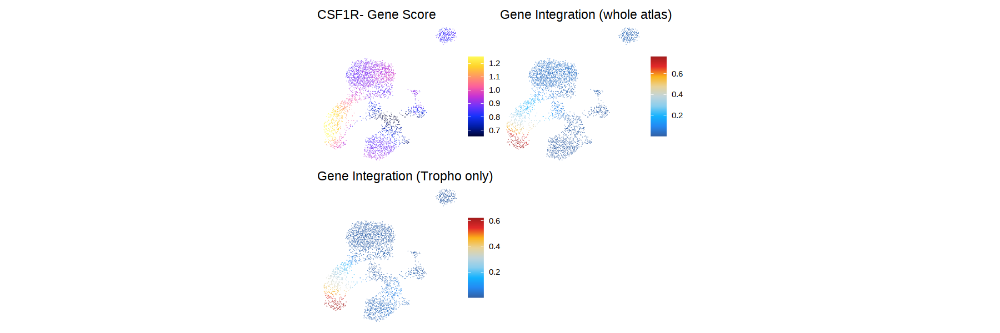

In [91]:
suppressMessages(plot_marker_gene('CSF1R'))

# Fix Trajectory

In [1]:
source(here::here("settings.R"))
ArchRProject <- loadArchRProject(file.path(io$basedir, 'ArchR/Trophoblast'))
library(viridis)

# I/O
io$plot.trophoblast = file.path(io$basedir, 'ArchR/Trophoblast/plots')
dir.create(io$plot.trophoblast, showWarnings = FALSE)

Setting default number of Parallel threads to 1.

Setting addArchRVerbose = FALSE

Successfully loaded ArchRProject!


                                                   / |
                                                 /    \
            .                                  /      |.
            \\\                              /        |.
              \\\                          /           `|.
                \\\                      /              |.
                  \                    /                |\
                  \\#####\           /                  ||
                ==###########>      /                   ||
                 \\##==......\    /                     ||
            ______ =       =|__ /__                     ||      \\\
        ,--' ,----`-,__ ___/'  --,-`-===================##========>
       \               '        ##_______ _____ ,--,__,=##,__   ///
        ,    __==    ___,-,__,--'#'  ==='      `-'    | ##,-/
        -,____,---'       \\####\\__

In [2]:
rename = data.table(Clusters = paste0('C', 1:10),
                   celltype_tropho = c( 'syncytiotrophoblast',
                                        'syncytiotrophoblast progenitors',
                                        'amnion 1', 
                                        'amnion 2', 
                                        'amnion 1',
                                        'amnion 3',
                                        'mixed',
                                        'trophoblast', 
                                        'cytotrophoblast 1', 
                                        'cytotrophoblast 2'
                                        )) 
rename = rename %>% .[match(ArchRProject@cellColData$Clusters, rename$Clusters),]
ArchRProject@cellColData$celltype_tropho = rename$celltype_tropho

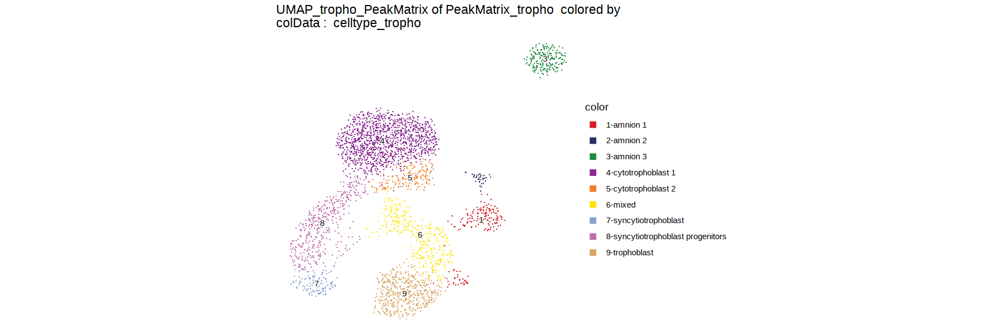

In [72]:
# Increasing QC doesn't change anything
#meta = ArchRProject@cellColData
#keep =  meta[TSSEnrichment>=2.8 & nFrags>=30000]$cell
plotEmbedding(
  ArchRProj = ArchRProject, #[keep],
  embedding = 'UMAP_tropho_PeakMatrix',
  colorBy = "cellColData",
  name = 'celltype_tropho') + theme_void()

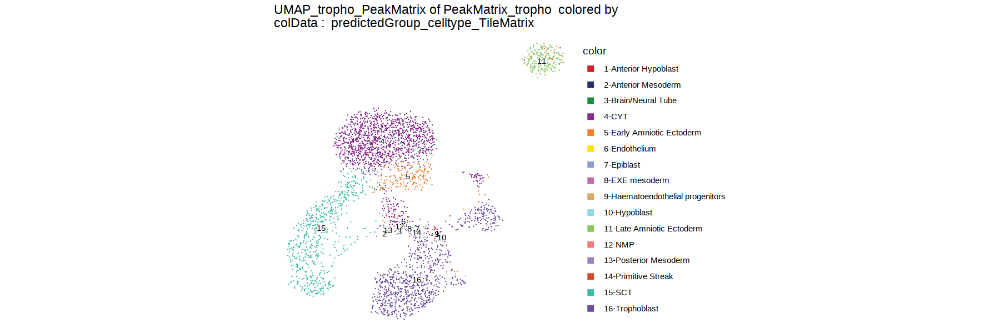

In [73]:
plotEmbedding(
  ArchRProj = ArchRProject,
  embedding = 'UMAP_tropho_PeakMatrix',
  colorBy = "cellColData",
  name = 'predictedGroup_celltype_TileMatrix') + theme_void()

# Trying to integrate with Mai-linh's old annotation

In [30]:
#### Read RNA ####
    io$RNA_in <- file.path(io$basedir,"RNA/RangedSummarizedExperiment.rds")
    sceRNA = readRDS(io$RNA_in)

In [31]:
old_meta = fread(file.path(io$basedir,"RNA/metadata.csv")) %>%
    setnames('index', 'cell') %>%
     .[,c('cell', 'celltype')] %>%
     .[order(match(cell, colnames(sceRNA))),] 

In [45]:
unique(old_meta$celltype)

[1] "Epiblast"                       "Visceral YS Endoderm"          
 [3] "Trophoblast"                    "Primitive Streak"              
 [5] "Hypoblast"                      "CYT"                           
 [7] "Haematoendothelial progenitors" "Anterior Hypoblast"            
 [9] "Notochord"                      "Placodes"                      
[11] "Neural Crest"                   "Parietal YS Endoderm"          
[13] "Early Amniotic Ectoderm"        "Posterior Mesoderm"            
[15] "Brain/Neural Tube"              "Late Amniotic Ectoderm"        
[17] "Somitic Mesoderm"               "Cranial Mesoderm"              
[19] "NMP"                            "Endothelium"                   
[21] "Limb Ectoderm"                  "Early Erythrocytes"            
[23] "Anterior Mesoderm"              "EXE mesoderm"                  
[25] "SCT"                            "Gut"                           
[27] "YS Mesothelium"                 "Cardiomyocytes"                
[29] "Late Erythrocytes"              "Chorion"                       
[31] "Allantois"                      "Megakaryocytes"                
[33] "Floor Plate"

In [37]:
colData(sceRNA) = old_meta %>% tibble::column_to_rownames('cell') %>% DataFrame

In [49]:
keep = c('Trophoblast', 'CYT', 'SCT', 'Early Amniotic Ectoderm', 'Late Amniotic Ectoderm')
sceRNA = sceRNA[,colData(sceRNA)$celltype %in% keep]

In [74]:
matrix = 'PeakMatrix'

# Add imputation 
ArchRProject <- addImputeWeights(ArchRProject, 
                                reducedDims = matrix)

Warning message in sprintf("Completed Getting Magic Weights!", round(object.size(weightList)/10^9, :
“one argument not used by format 'Completed Getting Magic Weights!'”


In [41]:
addArchRThreads(1)

Setting default number of Parallel threads to 1.



In [50]:
# Integrate
ArchRProject <- addGeneIntegrationMatrix(
    ArchRProj = ArchRProject, 
    useMatrix = "GeneScoreMatrix",
    matrixName = paste0("GeneIntegrationMatrix_", matrix),
    reducedDims =  matrix,
    seRNA = sceRNA,
    addToArrow = TRUE,
    force= TRUE,
    groupRNA = "celltype",
    nameCell = paste0("predictedCell_Un_tropho_old"),
    nameGroup = paste0("celltype_tropho_old"),
    nameScore = paste0("score_tropho_old"))

Warning message:
“Non-unique features (rownames) present in the input matrix, making unique”
Warning message:
“Feature names cannot have underscores ('_'), replacing with dashes ('-')”
Warning message in sprintf("Completed Getting Magic Weights!", round(object.size(weightList)/10^9, :
“one argument not used by format 'Completed Getting Magic Weights!'”
Getting ImputeWeights

Warning message in NSBS(i, x, exact = exact, strict.upper.bound = !allow.append, :
“subscript is an array, passing it thru as.vector() first”
Warning message in NSBS(i, x, exact = exact, strict.upper.bound = !allow.append, :
“subscript is an array, passing it thru as.vector() first”
Warning message in NSBS(i, x, exact = exact, strict.upper.bound = !allow.append, :
“subscript is an array, passing it thru as.vector() first”
Warning message in NSBS(i, x, exact = exact, strict.upper.bound = !allow.append, :
“subscript is an array, passing it thru as.vector() first”
Warning message in NSBS(i, x, exact = exact, strict.up

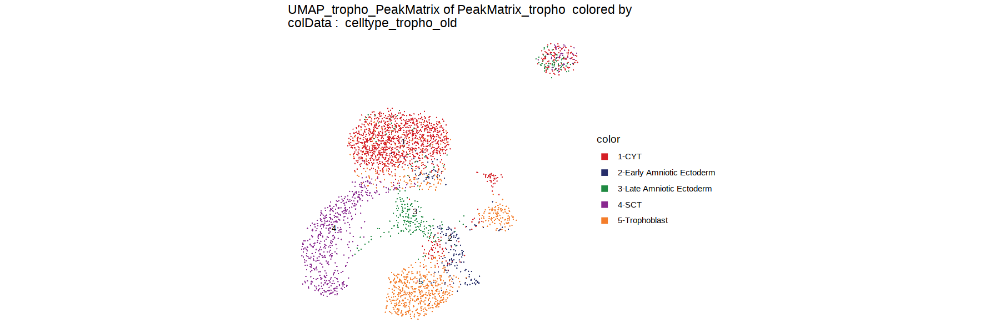

In [51]:
plotEmbedding(
  ArchRProj = ArchRProject,
  embedding = 'UMAP_tropho_PeakMatrix',
  colorBy = "cellColData",
  name = 'celltype_tropho_old') + theme_void()

In [3]:
#ArchRProject = ArchRProject[ArchRProject@cellColData$celltype_tropho_old %in% c('Trophoblast', 'CYT', 'SCT')]
ArchRProject = ArchRProject[ArchRProject@cellColData$predictedGroup_celltype_TileMatrix %in% c('Trophoblast', 'CYT', 'SCT')]

Dropping ImputeWeights Since You Are Subsetting Cells! ImputeWeights is a cell-x-cell Matrix!



Warning message:
“package ‘Seurat’ was built under R version 4.1.2”


Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 2722
Number of edges: 87863

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8654
Number of communities: 10
Elapsed time: 0 seconds


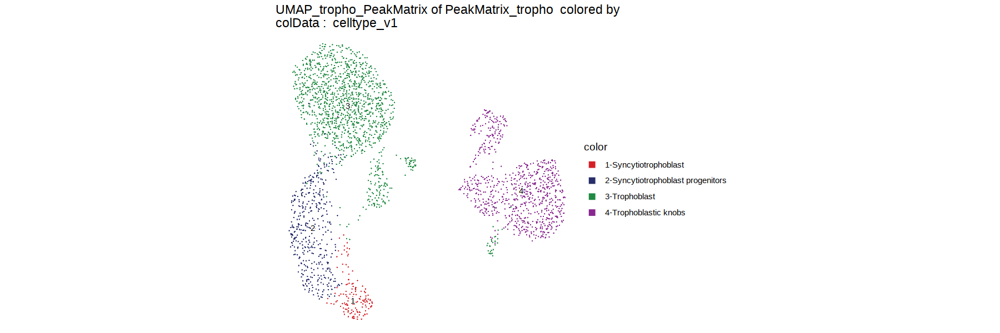

In [7]:
ArchRProject = suppressMessages(dim_redu(ndims=10, nfeatures=45000))

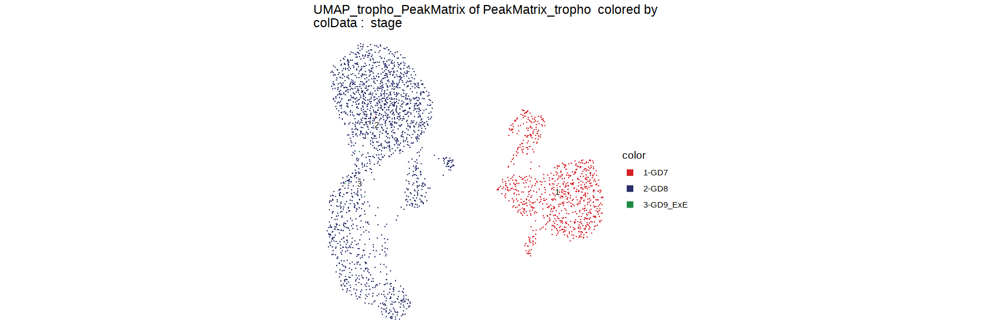

In [8]:
plotEmbedding(
  ArchRProj = ArchRProject,
  embedding = 'UMAP_tropho_PeakMatrix',
  colorBy = "cellColData",
  name = 'stage') + theme_void()

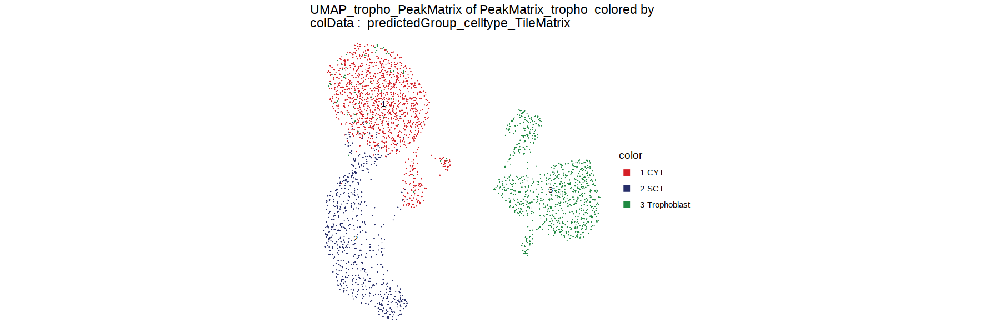

In [9]:
plotEmbedding(
  ArchRProj = ArchRProject,
  embedding = 'UMAP_tropho_PeakMatrix',
  colorBy = "cellColData",
  name = 'predictedGroup_celltype_TileMatrix') + theme_void()

In [66]:
colnames(ArchRProject@cellColData)

[1] "sample"                                
 [2] "Sample"                                
 [3] "TSSEnrichment"                         
 [4] "ReadsInTSS"                            
 [5] "ReadsInPromoter"                       
 [6] "PromoterRatio"                         
 [7] "PassQC"                                
 [8] "NucleosomeRatio"                       
 [9] "nMultiFrags"                           
[10] "nMonoFrags"                            
[11] "nFrags"                                
[12] "nDiFrags"                              
[13] "DoubletScore"                          
[14] "DoubletEnrichment"                     
[15] "stage"                                 
[16] "cell"                                  
[17] "Clusters_TileMatrix"                   
[18] "predictedCell_Un_TileMatrix"           
[19] "predictedGroup_celltype_TileMatrix"    
[20] "predictedScore_celltype_TileMatrix"    
[21] "ReadsInPeaks"                          
[22] "FRIP"                                  
[23] "predictedCell_Un_PeakMatrix"           
[24] "predictedGroup_celltype_PeakMatrix"    
[25] "predictedScore_celltype_PeakMatrix"    
[26] "stage_clusters"                        
[27] "cell.1"                                
[28] "Clusters_PeakMatrix"                   
[29] "celltype_v1"                           
[30] "celltype_v1_tile"                      
[31] "Clusters"                              
[32] "predictedCell_UnPeakMatrix_tropho"     
[33] "celltype_PeakMatrix_tropho"            
[34] "score_PeakMatrix_tropho"               
[35] "celltype_tropho"                       
[36] "predictedCell_Un_tropho_old_PeakMatrix"
[37] "celltype_tropho_old_PeakMatrix"        
[38] "score_tropho_old_PeakMatrix"           
[39] "predictedCell_Un_tropho_old"           
[40] "celltype_tropho_old"                   
[41] "score_tropho_old"                      
[42] "Tropho"

Plotting

Warning message:
“Removed 273 rows containing non-finite values (stat_summary_hex).”
Warning message:
“Removed 273 rows containing non-finite values (stat_summary_hex).”


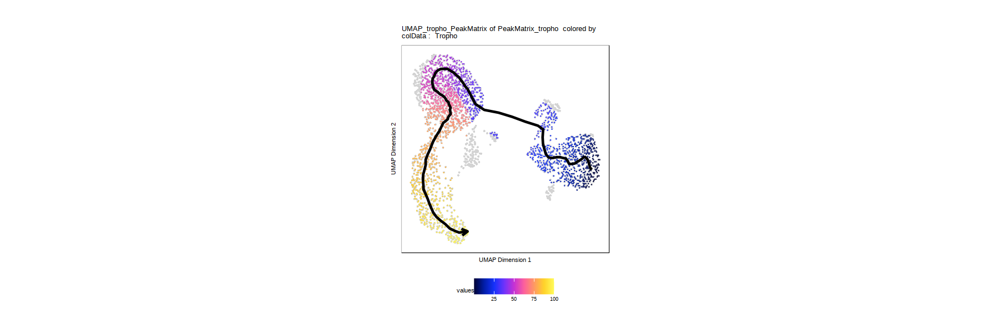

In [10]:
trajectory <- c('Trophoblast', 'CYT', 'SCT')

ArchRProject <- addTrajectory(
    ArchRProj = ArchRProject, 
    name = "Tropho", 
    groupBy = "predictedGroup_celltype_TileMatrix",
    trajectory = trajectory, 
    embedding = "UMAP_tropho_PeakMatrix",  ### Redudims but may look better based on embeddings
    force = TRUE
)

p <- plotTrajectory(ArchRProject, trajectory = "Tropho", colorBy = "cellColData", name = "Tropho", embedding = "UMAP_tropho_PeakMatrix")
p[[1]]

Getting ImputeWeights

No imputeWeights found, returning NULL

2022-03-08 13:10:10 : SuppressedMessaged due to getArchRVerbose() is FALSE!

Plotting

Warning message:
“Removed 273 rows containing non-finite values (stat_summary_hex).”
Warning message:
“Removed 273 rows containing non-finite values (stat_summary_hex).”
`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'



[[1]]

[[2]]


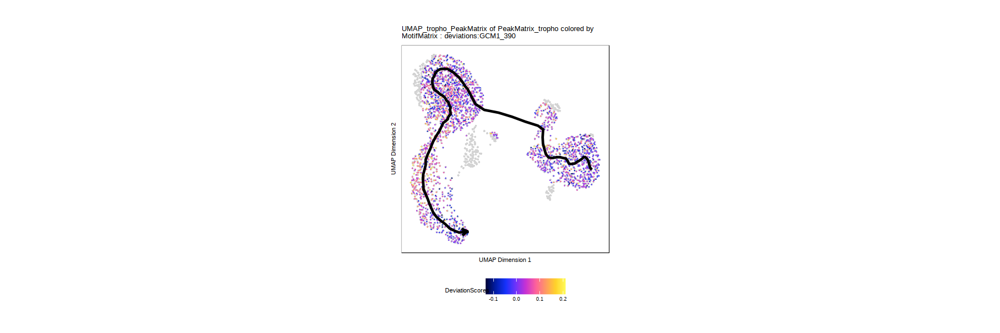

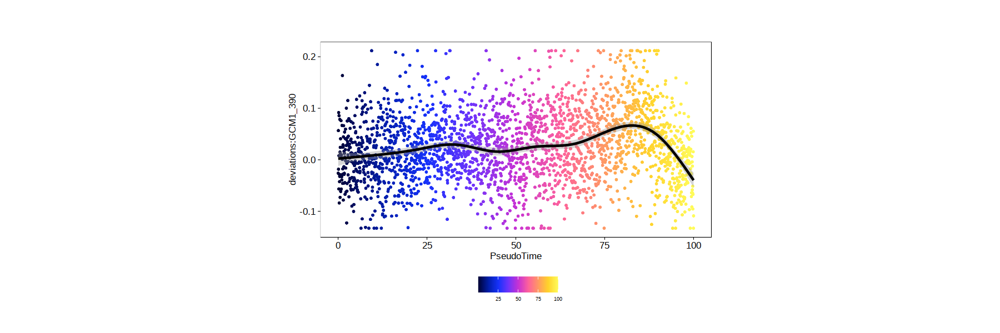

In [11]:
p = plotTrajectory(ArchRProject, 
                   trajectory = "Tropho", 
                   colorBy = "MotifMatrix", 
                   name = 'deviations:GCM1_390', 
                   continuousSet = "horizonExtra", 
                   embedding = "UMAP_tropho_PeakMatrix")
p

# End old anno test

In [21]:
meta = as.data.table(ArchRProject@cellColData)

In [42]:
celltype_keep = c('syncytiotrophoblast',
            'syncytiotrophoblast progenitors',
            'trophoblast', 
            'cytotrophoblast 1', 
            'cytotrophoblast 2')

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 2640
Number of edges: 115285

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8572
Number of communities: 7
Elapsed time: 0 seconds



           ___      .______        ______  __    __  .______      
          /   \     |   _  \      /      ||  |  |  | |   _  \     
         /  ^  \    |  |_)  |    |  ,----'|  |__|  | |  |_)  |    
        /  /_\  \   |      /     |  |     |   __   | |      /     
       /  _____  \  |  |\  \\___ |  `----.|  |  |  | |  |\  \\___.
      /__/     \__\ | _| `._____| \______||__|  |__| | _| `._____|
    



class: ArchRProject 
outputDirectory: /rds/project/rds-SDzz0CATGms/users/bt392/04_Rabbit_ATAC_final/rerun/ArchR/Trophoblast 
samples(4): rabbit_BGRGP1 rabbit_BGRGP3 rabbit_BGRGP2 rabbit_BGRGP4
sampleColData names(1): ArrowFiles
cellColData names(35): sample Sample ... score_PeakMatrix_tropho
  celltype_tropho
numberOfCells(1): 2640
medianTSS(1): 3.39
medianFrags(1): 38853.5

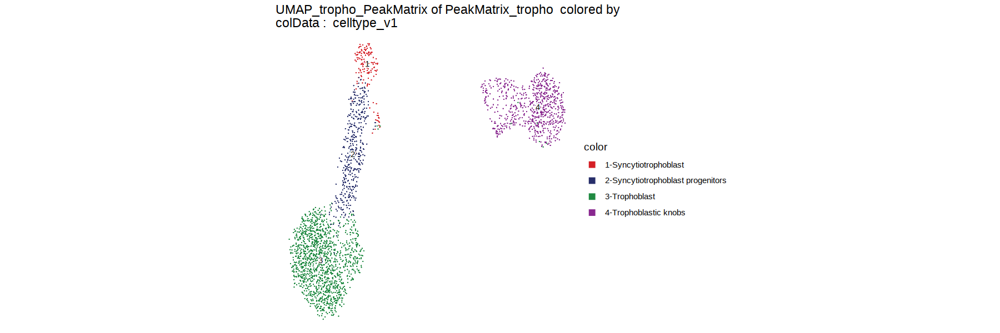

In [49]:
cell_keep = meta[celltype_tropho %in% celltype_keep | celltype_tropho == 'mixed' & stage == 'GD7']$cell
suppressMessages(dim_redu(ArchRProject[cell_keep], ndims=25, nfeatures=25000))

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 2434
Number of edges: 114316

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8473
Number of communities: 6
Elapsed time: 0 seconds



           ___      .______        ______  __    __  .______      
          /   \     |   _  \      /      ||  |  |  | |   _  \     
         /  ^  \    |  |_)  |    |  ,----'|  |__|  | |  |_)  |    
        /  /_\  \   |      /     |  |     |   __   | |      /     
       /  _____  \  |  |\  \\___ |  `----.|  |  |  | |  |\  \\___.
      /__/     \__\ | _| `._____| \______||__|  |__| | _| `._____|
    



class: ArchRProject 
outputDirectory: /rds/project/rds-SDzz0CATGms/users/bt392/04_Rabbit_ATAC_final/rerun/ArchR/Trophoblast 
samples(4): rabbit_BGRGP1 rabbit_BGRGP3 rabbit_BGRGP2 rabbit_BGRGP4
sampleColData names(1): ArrowFiles
cellColData names(35): sample Sample ... score_PeakMatrix_tropho
  celltype_tropho
numberOfCells(1): 2434
medianTSS(1): 3.3575
medianFrags(1): 38367.5

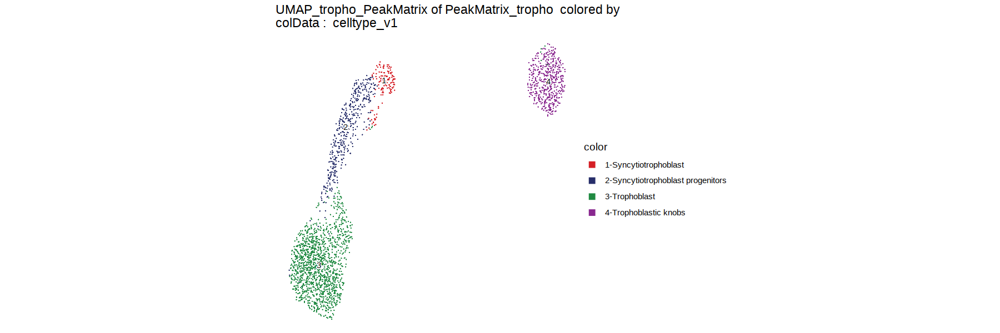

In [50]:
cell_keep = meta[celltype_tropho %in% celltype_keep]$cell
suppressMessages(dim_redu(ArchRProject[cell_keep], ndims=25, nfeatures=25000))

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 2780
Number of edges: 123281

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8585
Number of communities: 7
Elapsed time: 0 seconds



           ___      .______        ______  __    __  .______      
          /   \     |   _  \      /      ||  |  |  | |   _  \     
         /  ^  \    |  |_)  |    |  ,----'|  |__|  | |  |_)  |    
        /  /_\  \   |      /     |  |     |   __   | |      /     
       /  _____  \  |  |\  \\___ |  `----.|  |  |  | |  |\  \\___.
      /__/     \__\ | _| `._____| \______||__|  |__| | _| `._____|
    



class: ArchRProject 
outputDirectory: /rds/project/rds-SDzz0CATGms/users/bt392/04_Rabbit_ATAC_final/rerun/ArchR/Trophoblast 
samples(4): rabbit_BGRGP1 rabbit_BGRGP3 rabbit_BGRGP2 rabbit_BGRGP4
sampleColData names(1): ArrowFiles
cellColData names(35): sample Sample ... score_PeakMatrix_tropho
  celltype_tropho
numberOfCells(1): 2780
medianTSS(1): 3.3825
medianFrags(1): 39721

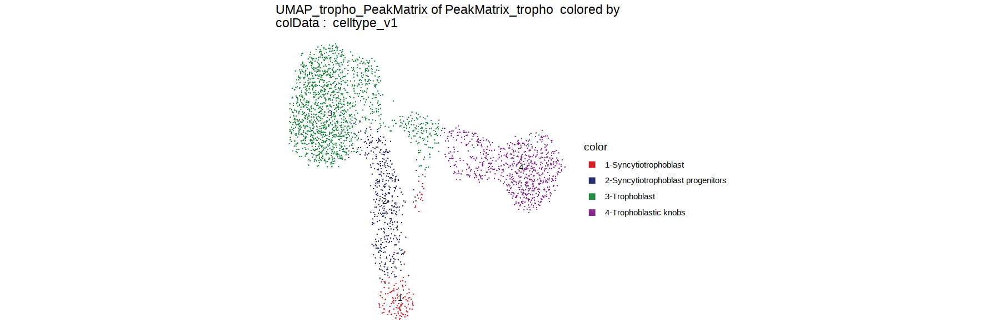

In [51]:
cell_keep = meta[celltype_tropho %in% celltype_keep | celltype_tropho == 'mixed']$cell
suppressMessages(dim_redu(ArchRProject[cell_keep], ndims=25, nfeatures=25000))

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 2780
Number of edges: 123281

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8585
Number of communities: 7
Elapsed time: 0 seconds



           ___      .______        ______  __    __  .______      
          /   \     |   _  \      /      ||  |  |  | |   _  \     
         /  ^  \    |  |_)  |    |  ,----'|  |__|  | |  |_)  |    
        /  /_\  \   |      /     |  |     |   __   | |      /     
       /  _____  \  |  |\  \\___ |  `----.|  |  |  | |  |\  \\___.
      /__/     \__\ | _| `._____| \______||__|  |__| | _| `._____|
    



class: ArchRProject 
outputDirectory: /rds/project/rds-SDzz0CATGms/users/bt392/04_Rabbit_ATAC_final/rerun/ArchR/Trophoblast 
samples(4): rabbit_BGRGP1 rabbit_BGRGP3 rabbit_BGRGP2 rabbit_BGRGP4
sampleColData names(1): ArrowFiles
cellColData names(35): sample Sample ... score_PeakMatrix_tropho
  celltype_tropho
numberOfCells(1): 2780
medianTSS(1): 3.3825
medianFrags(1): 39721

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 2780
Number of edges: 125817

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8610
Number of communities: 7
Elapsed time: 0 seconds


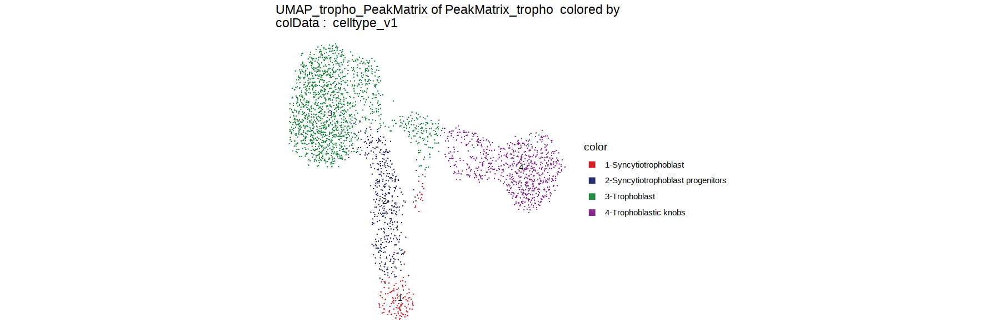


           ___      .______        ______  __    __  .______      
          /   \     |   _  \      /      ||  |  |  | |   _  \     
         /  ^  \    |  |_)  |    |  ,----'|  |__|  | |  |_)  |    
        /  /_\  \   |      /     |  |     |   __   | |      /     
       /  _____  \  |  |\  \\___ |  `----.|  |  |  | |  |\  \\___.
      /__/     \__\ | _| `._____| \______||__|  |__| | _| `._____|
    



class: ArchRProject 
outputDirectory: /rds/project/rds-SDzz0CATGms/users/bt392/04_Rabbit_ATAC_final/rerun/ArchR/Trophoblast 
samples(4): rabbit_BGRGP1 rabbit_BGRGP3 rabbit_BGRGP2 rabbit_BGRGP4
sampleColData names(1): ArrowFiles
cellColData names(35): sample Sample ... score_PeakMatrix_tropho
  celltype_tropho
numberOfCells(1): 2780
medianTSS(1): 3.3825
medianFrags(1): 39721

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 2780
Number of edges: 100562

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8603
Number of communities: 7
Elapsed time: 0 seconds


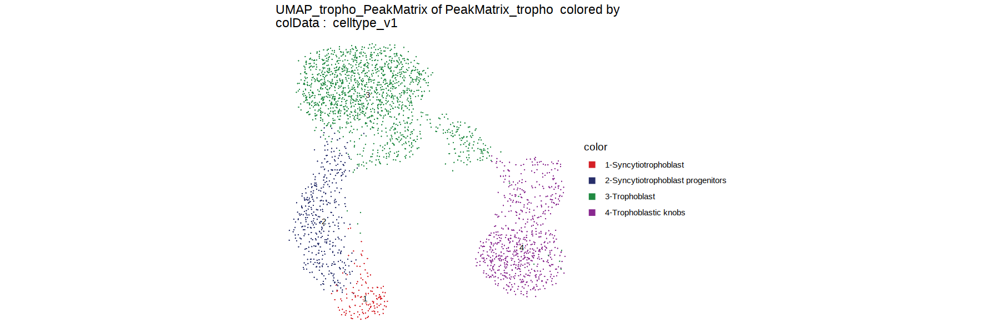


           ___      .______        ______  __    __  .______      
          /   \     |   _  \      /      ||  |  |  | |   _  \     
         /  ^  \    |  |_)  |    |  ,----'|  |__|  | |  |_)  |    
        /  /_\  \   |      /     |  |     |   __   | |      /     
       /  _____  \  |  |\  \\___ |  `----.|  |  |  | |  |\  \\___.
      /__/     \__\ | _| `._____| \______||__|  |__| | _| `._____|
    



class: ArchRProject 
outputDirectory: /rds/project/rds-SDzz0CATGms/users/bt392/04_Rabbit_ATAC_final/rerun/ArchR/Trophoblast 
samples(4): rabbit_BGRGP1 rabbit_BGRGP3 rabbit_BGRGP2 rabbit_BGRGP4
sampleColData names(1): ArrowFiles
cellColData names(35): sample Sample ... score_PeakMatrix_tropho
  celltype_tropho
numberOfCells(1): 2780
medianTSS(1): 3.3825
medianFrags(1): 39721

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 2780
Number of edges: 103345

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8494
Number of communities: 7
Elapsed time: 0 seconds


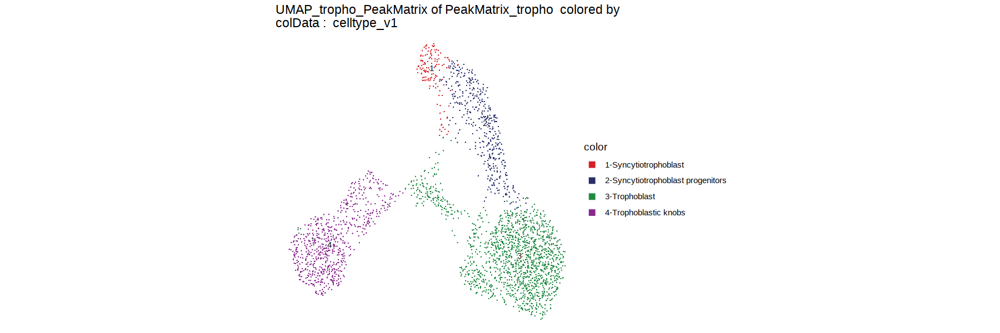


           ___      .______        ______  __    __  .______      
          /   \     |   _  \      /      ||  |  |  | |   _  \     
         /  ^  \    |  |_)  |    |  ,----'|  |__|  | |  |_)  |    
        /  /_\  \   |      /     |  |     |   __   | |      /     
       /  _____  \  |  |\  \\___ |  `----.|  |  |  | |  |\  \\___.
      /__/     \__\ | _| `._____| \______||__|  |__| | _| `._____|
    



class: ArchRProject 
outputDirectory: /rds/project/rds-SDzz0CATGms/users/bt392/04_Rabbit_ATAC_final/rerun/ArchR/Trophoblast 
samples(4): rabbit_BGRGP1 rabbit_BGRGP3 rabbit_BGRGP2 rabbit_BGRGP4
sampleColData names(1): ArrowFiles
cellColData names(35): sample Sample ... score_PeakMatrix_tropho
  celltype_tropho
numberOfCells(1): 2780
medianTSS(1): 3.3825
medianFrags(1): 39721

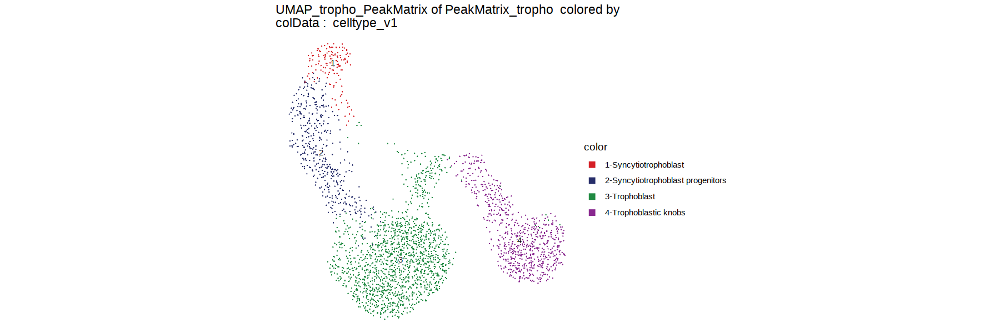

In [53]:
suppressMessages(dim_redu(ArchRProject[cell_keep], ndims=25, nfeatures=25000))
suppressMessages(dim_redu(ArchRProject[cell_keep], ndims=25, nfeatures=15000))
suppressMessages(dim_redu(ArchRProject[cell_keep], ndims=15, nfeatures=25000))
suppressMessages(dim_redu(ArchRProject[cell_keep], ndims=15, nfeatures=15000))

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 2640
Number of edges: 115285

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8572
Number of communities: 7
Elapsed time: 0 seconds


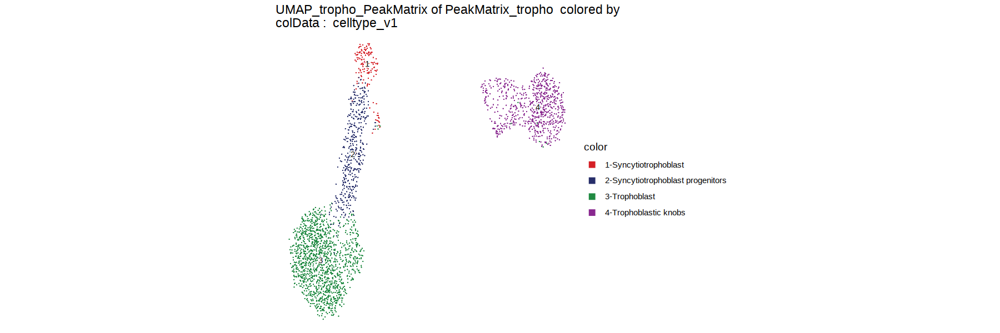

In [67]:
cell_keep = meta[celltype_tropho %in% celltype_keep | celltype_tropho == 'mixed' & stage == 'GD7']$cell
ArchRProject = suppressMessages(dim_redu(ArchRProject[cell_keep], ndims=25, nfeatures=25000))

Plotting

Warning message:
“Removed 2192 rows containing non-finite values (stat_summary_hex).”
Warning message:
“Removed 2192 rows containing non-finite values (stat_summary_hex).”


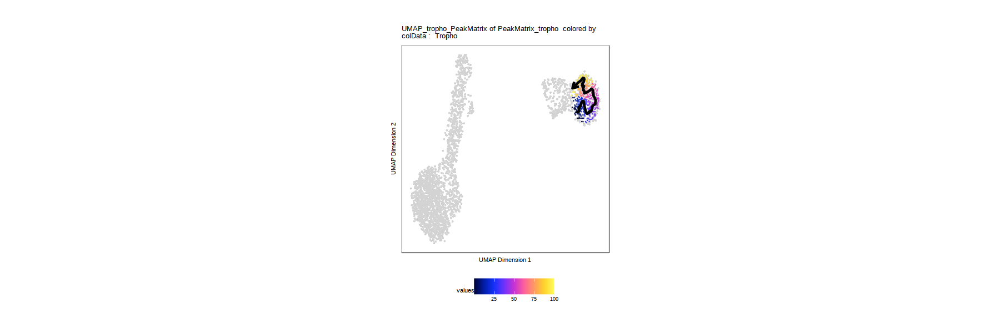

In [68]:
trajectory <- c('syncytiotrophoblast',
                'syncytiotrophoblast progenitors',
                'trophoblast', 
                'cytotrophoblast 1', 
                'cytotrophoblast 2', 
                'mixed')

ArchRProject <- addTrajectory(
    ArchRProj = ArchRProject, 
    name = "Tropho", 
    groupBy = "celltype_tropho",
    trajectory = trajectory, 
    embedding = "UMAP_tropho_PeakMatrix",  ### Redudims but may look better based on embeddings
    force = TRUE
)

p <- plotTrajectory(ArchRProject, trajectory = "Tropho", colorBy = "cellColData", name = "Tropho", embedding = "UMAP_tropho_PeakMatrix")
p[[1]]

In [57]:
ArchRProject = addImputeWeights(ArchRProject,reducedDims='PeakMatrix_tropho')

Warning message in sprintf("Completed Getting Magic Weights!", round(object.size(weightList)/10^9, :
“one argument not used by format 'Completed Getting Magic Weights!'”


Getting ImputeWeights

2022-03-04 15:15:09 : SuppressedMessaged due to getArchRVerbose() is FALSE!

Imputing Matrix

Plotting

Warning message:
“Removed 278 rows containing non-finite values (stat_summary_hex).”
Warning message:
“Removed 278 rows containing non-finite values (stat_summary_hex).”
`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'



[[1]]

[[2]]


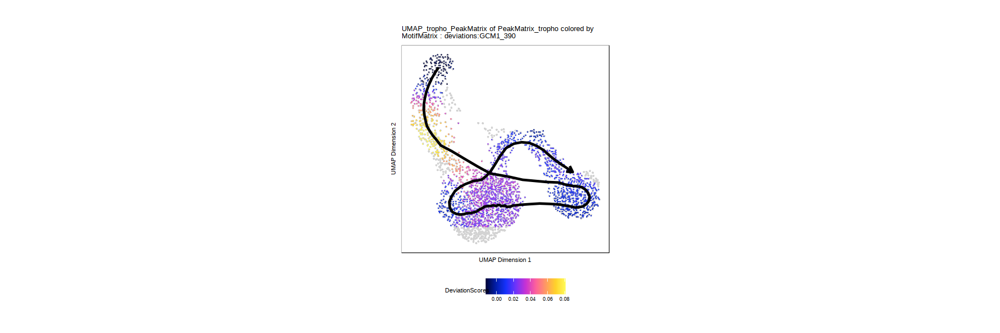

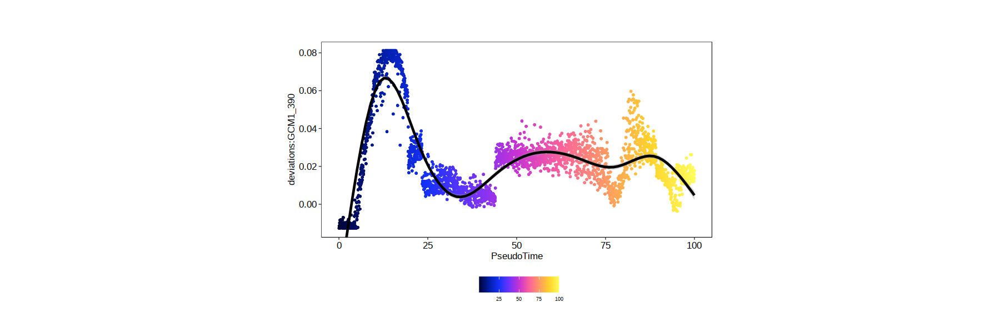

In [58]:
p = plotTrajectory(ArchRProject, 
                   trajectory = "Tropho", 
                   colorBy = "MotifMatrix", 
                   name = 'deviations:GCM1_390', 
                   continuousSet = "horizonExtra", 
                   embedding = "UMAP_tropho_PeakMatrix")
p

In [20]:
trajMM  <- getTrajectory(ArchRProj = ArchRProject, name = "Tropho", useMatrix = "MotifMatrix", log2Norm = FALSE)
names = sapply(strsplit(rownames(trajMM),":"), `[`, 2)
names = sapply(strsplit(names,"_"), `[`, 1)
rownames(trajMM) = names

Creating Trajectory Group Matrix..

Some values are below 0, this could be a DeviationsMatrix in which scaleTo should be set = NULL.
Continuing without depth normalization!

Smoothing...



# Plotting

In [92]:
umap = getEmbedding(ArchRProject, embedding='UMAP_tropho_PeakMatrix')
colnames(umap) = c('umap1', 'umap2')
umap = as.data.frame(merge(umap, ArchRProject@cellColData, by=0))

png 
  2

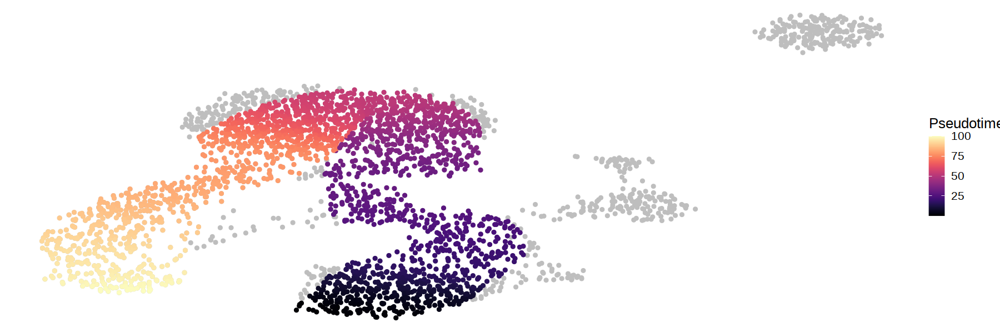

In [93]:
p = ggplot(umap, aes(umap1, umap2)) + 
    geom_point(col='grey') + 
    geom_point(data=umap[!is.na(umap$Tropho),], aes(umap1, umap2, col=Tropho)) + 
    scale_color_viridis(option='magma', name='Pseudotime') + 
    theme_void() + theme(text=element_text(size=15))

p
pdf(file = file.path(io$plot.trophoblast, 'Trophoblast_pseudotime.pdf'), width = 10, height = 10) 
    p 
dev.off()

In [94]:
# Get gene score matrix
GeneScore = getMatrixFromProject(
  ArchRProj = ArchRProject,
  useMatrix = "GeneScoreMatrix")

# Rename columns & rows
gene_names = GeneScore@elementMetadata$name
GeneScore = GeneScore@assays@data$GeneScoreMatrix
rownames(GeneScore) = gene_names

# Get GeneIntegrationMatrix matrix
GeneIntegration = getMatrixFromProject(
  ArchRProj = ArchRProject,
  useMatrix = "GeneIntegrationMatrix_PeakMatrix")

# Rename columns & rows
gene_names = GeneIntegration@elementMetadata$name
GeneIntegration = GeneIntegration@assays@data$GeneIntegration
rownames(GeneIntegration) = gene_names

# Get gene score matrix
Motif = getMatrixFromProject(
  ArchRProj = ArchRProject,
  useMatrix = "MotifMatrix")

# Rename columns & rows
gene_names = sapply(strsplit(Motif@elementMetadata$name,"_"), `[`, 1)
Motif = Motif@assays@data$z
rownames(Motif) = gene_names

In [116]:

# Get GeneIntegrationMatrix matrix
GeneIntegration = getMatrixFromProject(
  ArchRProj = ArchRProject,
  useMatrix = "GeneIntegrationMatrix_PeakMatrix_tropho")
# Rename columns & rows
gene_names = GeneIntegration@elementMetadata$name
GeneIntegration = GeneIntegration@assays@data$GeneIntegration
rownames(GeneIntegration) = gene_names

In [101]:
plot_traj = function(gene){
    umap = getEmbedding(ArchRProject, embedding='UMAP_tropho_PeakMatrix')
    colnames(umap) = c('umap1', 'umap2')
    umap = as.data.frame(merge(umap, ArchRProject@cellColData, by=0))
    id = gene

    
#     # gene score
#     imputed_genescore = suppressMessages(imputeMatrix(mat = t(as.matrix(GeneScore[id,])), 
#                                      imputeWeights = getImputeWeights(ArchRProject)))
#     imputed_genescore = as.data.frame(imputed_genescore) 
    
#     colnames(imputed_genescore) = 'genescore'
    
#     umap = merge(umap, imputed_genescore, by.x='Row.names', by.y=0)
    
#     p11 = ggplot(umap, aes(umap1, umap2)) + 
#         geom_point(col='grey') + 
#         geom_point(data=umap[!is.na(umap$Tropho),], aes(umap1, umap2, col=genescore)) + 
#         scale_color_viridis(option='magma', name='GeneScore') + 
#         ggtitle(gene) + 
#         theme_void() + 
#         theme(text=element_text(size=10), 
#               plot.title = element_text(size=22))
    
#     p12 = ggplot(umap[!is.na(umap$Tropho),], aes(Tropho,genescore, col= genescore)) + 
#         geom_point() + 
#         scale_color_viridis(option='magma', name='GeneScore') +
#         geom_smooth(col='black') + 
#         xlab('Pseudotime') + ylab('Gene Score') + 
#         theme_classic() + 
#         theme(text = element_text(size = 15), 
#               legend.title=element_text(size=10))
    
    # gene integration
    imputed_geneintegration = suppressMessages(imputeMatrix(mat = t(as.matrix(GeneIntegration[id,])), 
                                     imputeWeights = getImputeWeights(ArchRProject)))
  #  imputed_geneintegration = GeneIntegration[id,]
    
    
    imputed_geneintegration = as.data.frame(imputed_geneintegration) 
    colnames(imputed_geneintegration) = 'geneintegration'
    
    umap = merge(umap, imputed_geneintegration, by.x='Row.names', by.y=0)
    
    p21 = ggplot(umap, aes(umap1, umap2)) + 
        geom_point(col='grey') + 
        geom_point(data=umap[!is.na(umap$Tropho),], aes(umap1, umap2, col=geneintegration))  + 
        scale_color_viridis(option='plasma', name='GeneIntegration') + 
        ggtitle(gene) + 
        theme_void() + 
        theme(text=element_text(size=10), 
              plot.title = element_text(size=22))
    
    p22 = ggplot(umap[!is.na(umap$Tropho),], aes(Tropho,geneintegration, col= geneintegration)) + 
        geom_point() + 
        scale_color_viridis(option='plasma', name='geneintegration') +
        geom_smooth(col='black') + 
        xlab('Pseudotime') + ylab('Gene Integration') + 
        theme_classic() + 
        theme(text = element_text(size = 15), 
              legend.title=element_text(size=10))
    
    # motifs
    if(gene %in% rownames(Motif)){
        imputed_motif = suppressMessages(imputeMatrix(mat = t(as.matrix(Motif[gene,])), 
                                        imputeWeights = getImputeWeights(ArchRProject)))
#imputed_motif = Motif[gene,]
        imputed_motif = as.data.frame(imputed_motif) 
        colnames(imputed_motif) = 'motif'

        umap = merge(umap, imputed_motif, by.x='Row.names', by.y=0)

        p31 = ggplot(umap, aes(umap1, umap2)) + 
            geom_point(col='grey') + 
            geom_point(data=umap[!is.na(umap$Tropho),], aes(umap1, umap2, col=motif)) + 
            scale_color_viridis(option='viridis', name='MotifAccessibility') + 
            ggtitle('') + 
            theme_void() +
            theme(text=element_text(size=10), 
                  plot.title = element_text(size=22))

        p32 = ggplot(umap[!is.na(umap$Tropho),], aes(Tropho,motif, col= motif)) + 
            geom_point() + 
            scale_color_viridis(option='viridis', name='motif') +
            geom_smooth(col='black') + 
            xlab('Pseudotime') + ylab('Motif Accessibility') + 
            theme_classic() + 
            theme(text = element_text(size = 15), 
                  legend.title=element_text(size=10))
    
   # grid.arrange(p11,p21,p31, p12, p22, p32, ncol=3)
    grid.arrange(p21,p31, p22, p32, ncol=2)

    }else{
       # grid.arrange(p11,p21,p12, p22, ncol=2)
        grid.arrange(p21, p22, ncol=1)

    }

}

In [117]:
gene_integration_genes = getFeatures(
  ArchRProj = ArchRProject,
  useMatrix = "GeneIntegrationMatrix_PeakMatrix")
gene_integration_genes = lapply(strsplit(gene_integration_genes, ":"), `[`, 2)
all_genes = gene_integration_genes

# genescore_genes = getFeatures(
#   ArchRProj = ArchRProject,
#   useMatrix = "GeneScoreMatrix")
# genescore_genes = lapply(strsplit(genescore_genes, ":"), `[`, 2)
#all_genes = intersect(genescore_genes, gene_integration_genes)

In [97]:
genes = c(
#         'VTCN1',
#        'GCM1',
#         'PDE6H',# from https://academic.oup.com/endo/article/150/2/1000/2455727
#         'S100A4',
#         'TNNI2',
#         'COL11A1',
#         'ADAM12',
#         'FABP7',
#         'SPON2',          
#         'ND2',# Trophoblast markers atlas
#         'COX2',
#         'CDK2', 
#         'ATP6V0E1', 
#         'RPN1', 
#         'SOD1', 
#        'GATA3',
#         'HSPD1', 
#            'FABP3',
#         'NME2',
#          'ORY1',
#     'SYN1', 'SYN2',
#    'TEAD1','CDX4','CDX1', 'TEAD3', 'RREB1', 'ELF5', 'MITF', 'USF1', 'ID2', 'ID1', 'TFAP2C', 'TFAP2B', #heatmap
#     'CEPBA',
  #  'DLX5', 'DLX6', # Mai-linh genes of interest
     'TEAD4', 'GATA3','CDX2', 'HOXA11', 'HOXC9', 'PATZ1', 'ZNF740', 'CEBPA', 'ELF3', 'TFEB', 'MITF', 'MXI1', 'TP63', 'GCM1',
    'GREM2', 'GPR126', 'USP53','EFNB3', 'TFAP2C', 'TFAP2E', 'TFAP2A', 'TFAP2B'
         ) 

In [118]:
genes = genes[genes %in% all_genes]

In [119]:
genes

[1] "TEAD4"  "GATA3"  "HOXA11" "PATZ1"  "ZNF740" "CEBPA"  "ELF3"   "TFEB"  
 [9] "MITF"   "MXI1"   "TP63"   "GCM1"   "GREM2"  "USP53"  "EFNB3"  "TFAP2A"
[17] "TFAP2B"

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'



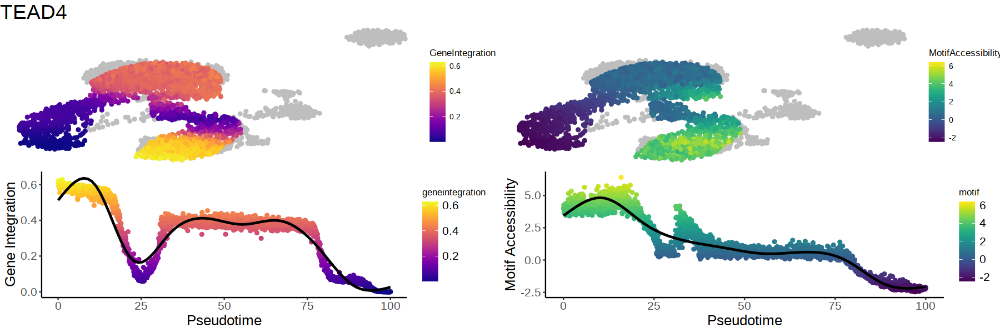

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'



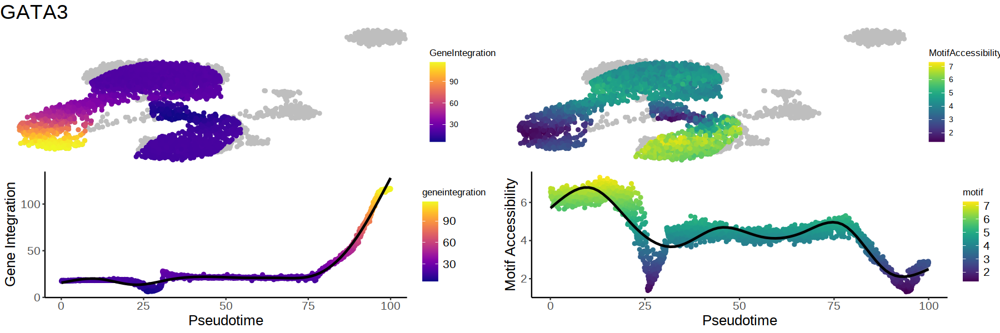

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'



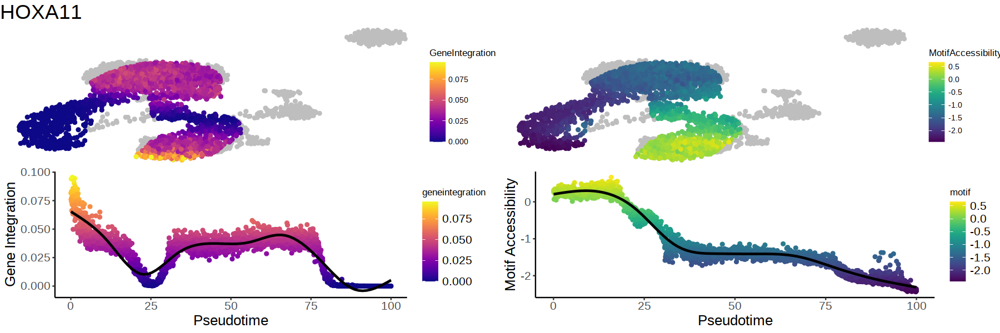

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'



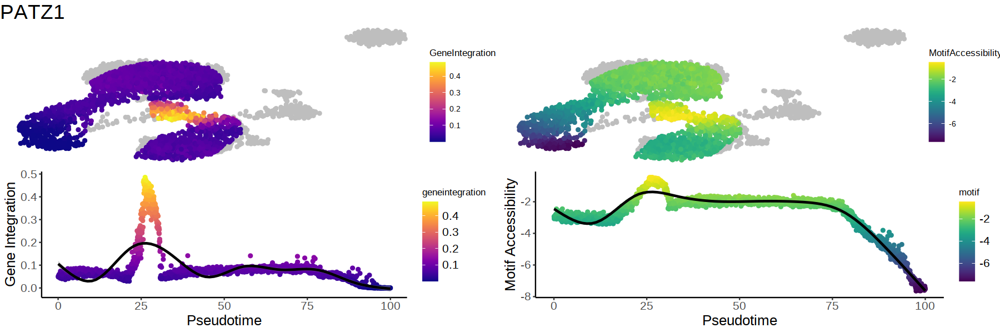

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'



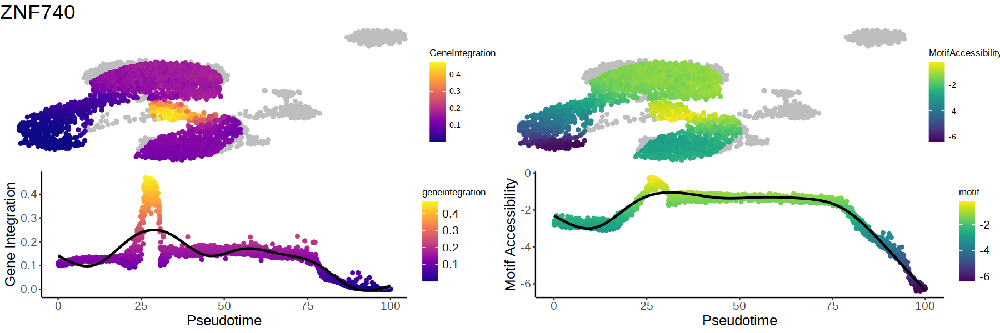

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'



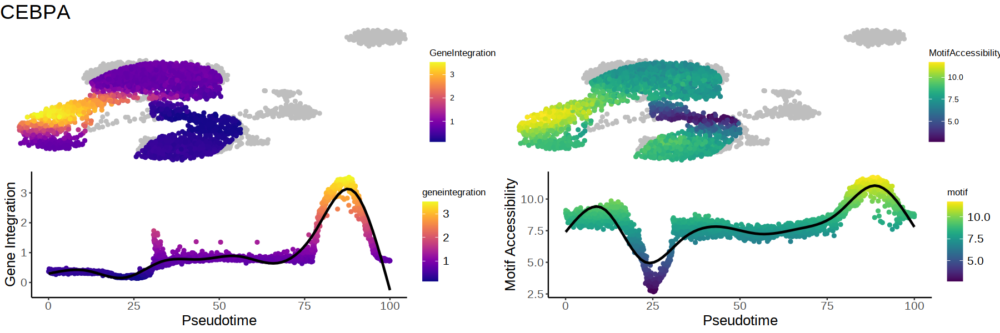

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'



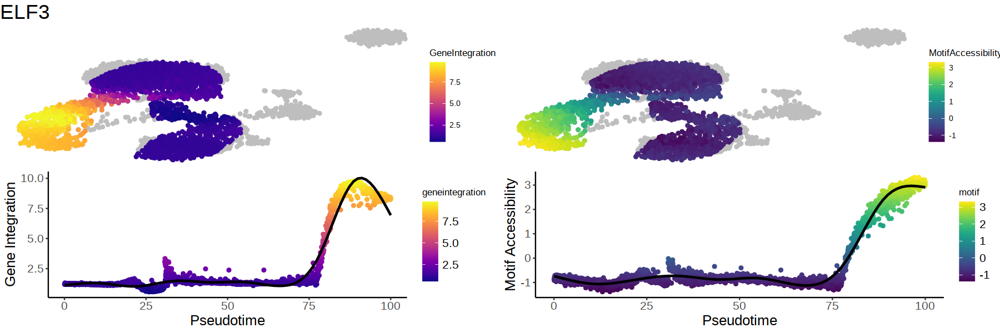

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'



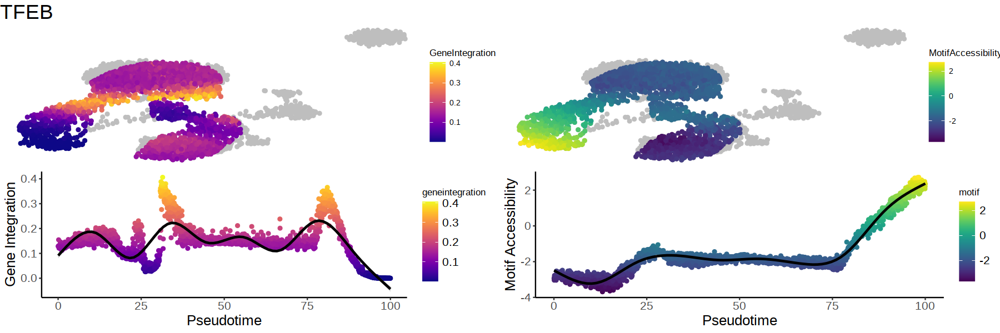

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'



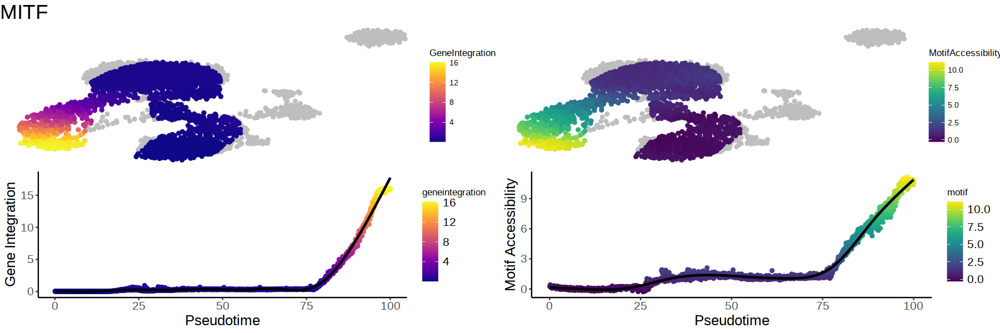

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'



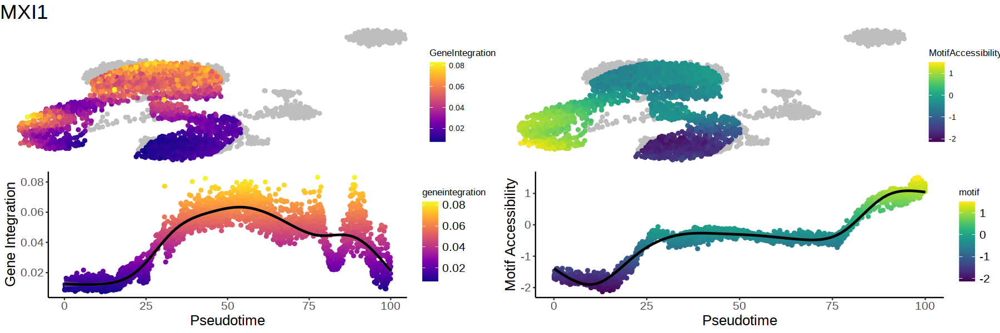

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'



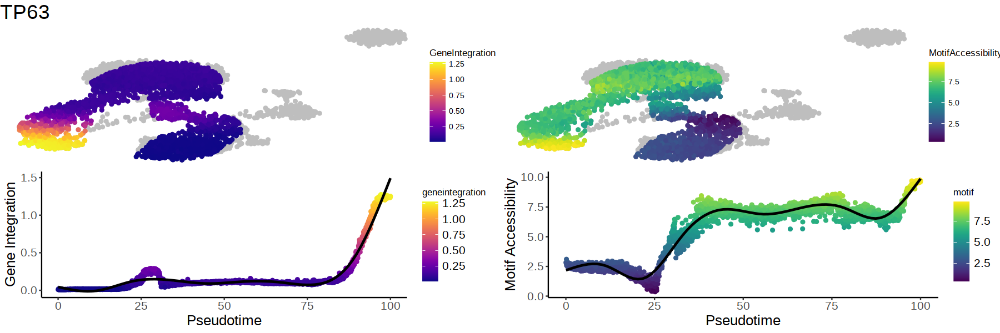

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'

Warning message:
“Computation failed in `stat_smooth()`:
NA/NaN/Inf in foreign function call (arg 3)”


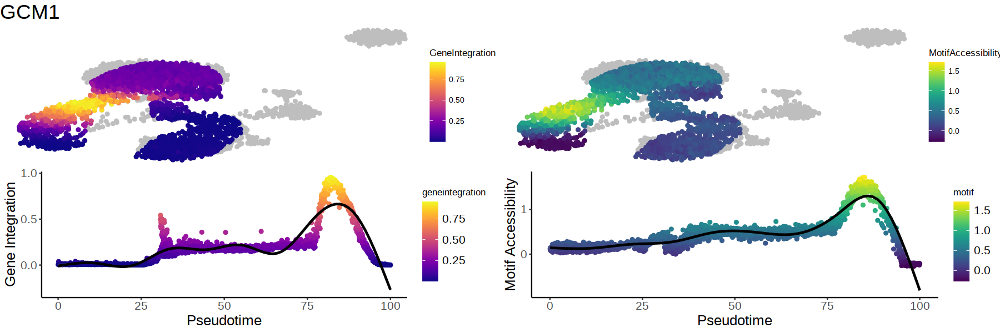

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'



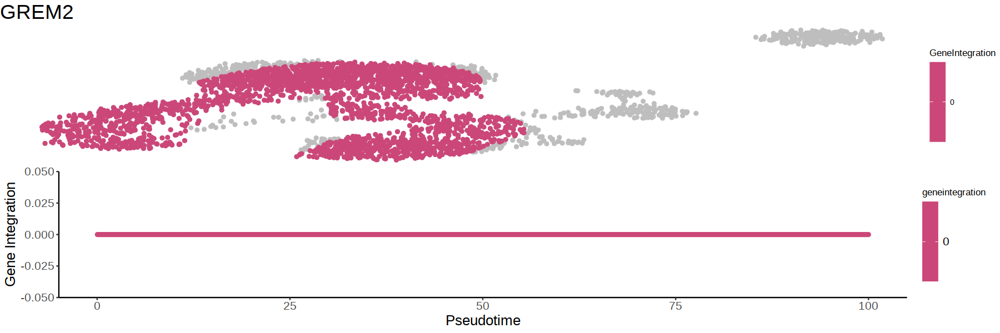

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'



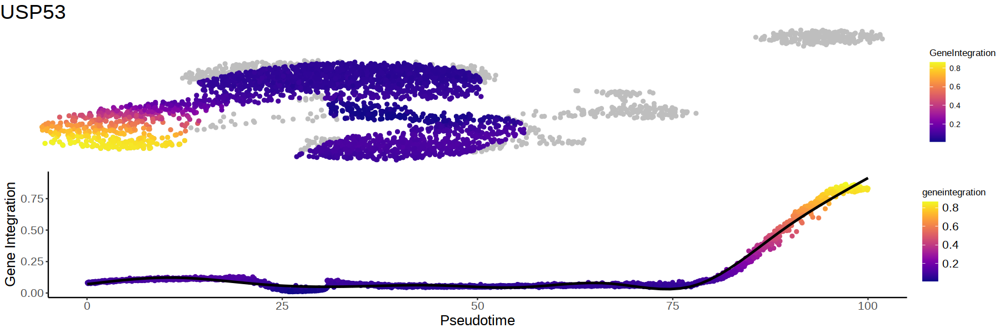

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'



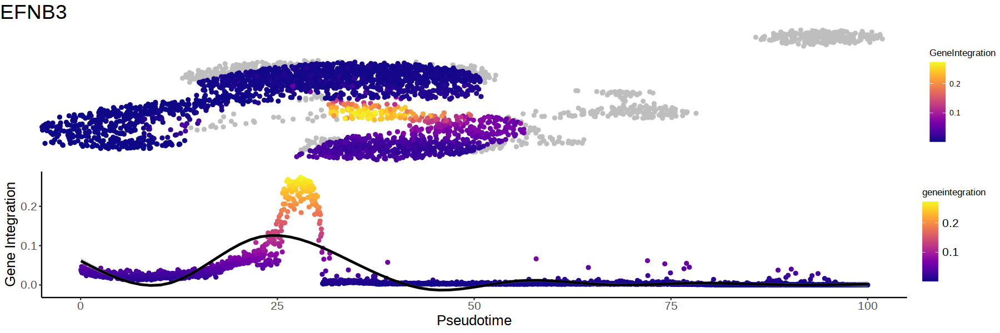

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'



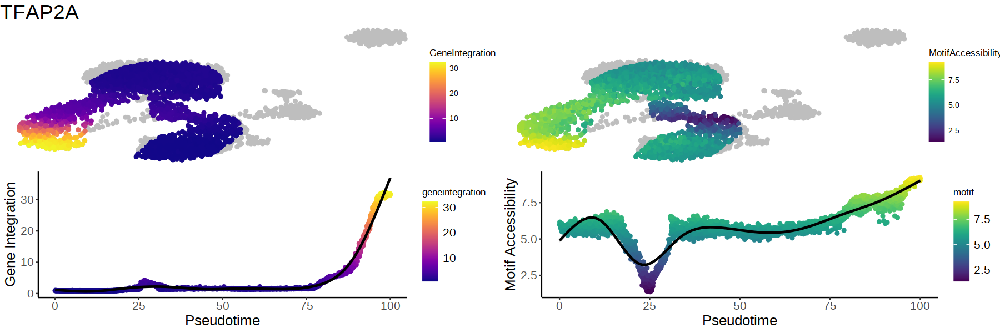

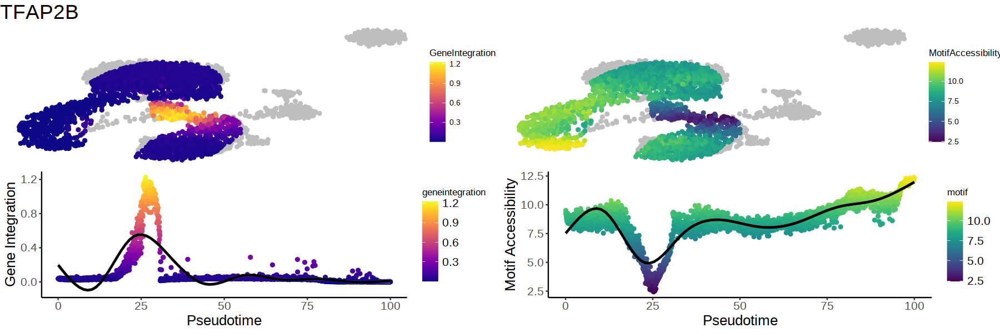

In [121]:
for(i in genes){
        plot_traj(i)
}

In [36]:
for(i in genes){
    pdf(file = file.path(io$plot.trophoblast, paste0(i,'_trophoblast.pdf')), width = 15, height = 8) 
        plot_traj(i)
    dev.off()
}

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'

`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = 

### Motifs

In [37]:
trajMM  <- getTrajectory(ArchRProj = ArchRProject, name = "Tropho", useMatrix = "MotifMatrix", log2Norm = FALSE)
names = sapply(strsplit(rownames(trajMM),":"), `[`, 2)
names = sapply(strsplit(names,"_"), `[`, 1)
rownames(trajMM) = names

Creating Trajectory Group Matrix..

Some values are below 0, this could be a DeviationsMatrix in which scaleTo should be set = NULL.
Continuing without depth normalization!

Smoothing...



In [38]:
p1 = plotTrajectoryHeatmap(trajMM, pal = paletteContinuous(set = "solarExtra"), labelTop  = 100)

ArchR logging to : ArchRLogs/ArchR-plotTrajectoryHeatmap-1f5c432f83924-Date-2022-02-23_Time-16-47-56.log
If there is an issue, please report to github with logFile!

useSeqnames is NULL or greater than 1 with a Sparse.Assays.Matrix trajectory input.

2022-02-23 16:47:56 : 

force=FALSE thus continuing with subsetting useSeqnames = z

2022-02-23 16:47:56 : 

Preparing Main Heatmap..

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.

ArchR logging successful to : ArchRLogs/ArchR-plotTrajectoryHeatmap-1f5c432f83924-Date-2022-02-23_Time-16-47-56.log



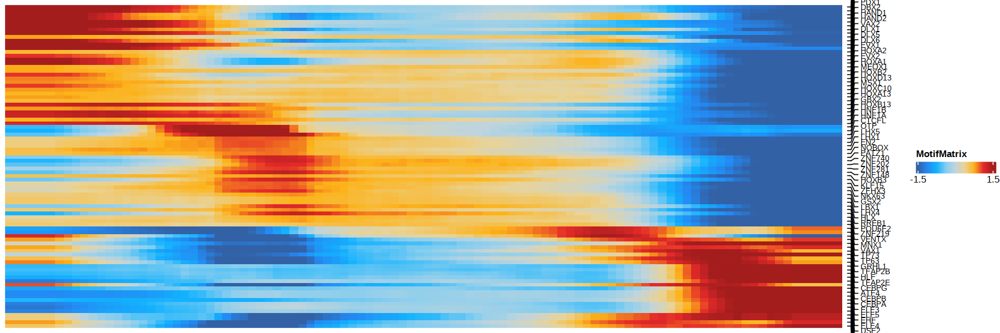

In [45]:
p1

In [40]:
# Export TF names in heatmap to select ones of interest
write.csv(rownames(p1@ht_list$MotifMatrix@matrix),file.path(io$plot.trophoblast, 'heatmap_motifs.csv'), row.names=FALSE)

In [41]:
motifs_to_keep = c('TEAD4', 
                   'GATA3',
                   'CDX2', 
                   'HOXA11', 
                   'HOXC9', 
                   'PATZ1', 
                   'ZNF740', 
                   'CEBPA', 
                   'ELF3', 
                   'TFEB', 
                   'MITF', 
                   'MXI1', 
                   'TP63', 
                   'GCM1',
                    'GREM2', 
                   'GPR126', 
                   'USP53',
                   'EFNB3', 
                   'TFAP2C', 
                   'TFAP2A'
                   
                  )
keep = grep(paste(motifs_to_keep, collapse='|'), rownames(trajMM), value = TRUE)

keep_rows = data.table('TF' = rownames(p1@ht_list$MotifMatrix@matrix), 'row' = 1:length(rownames(p1@ht_list$MotifMatrix@matrix))) %>%
    .[TF %in% keep,] %>% .$row

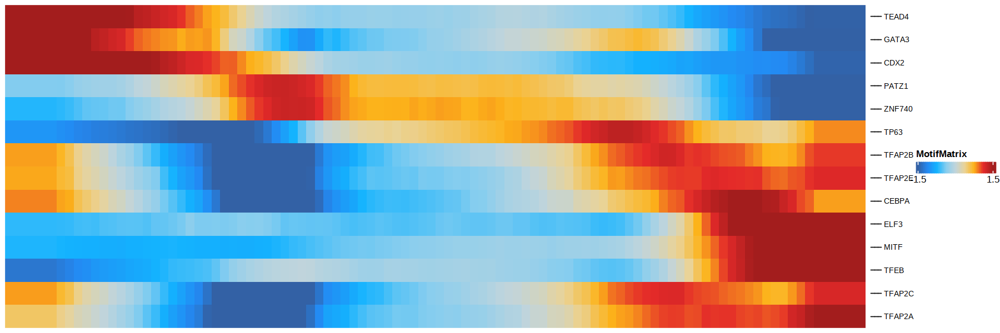

In [46]:
p1[keep_rows] 

In [14]:
trajGSM <- getTrajectory(ArchRProj = ArchRProject, name = "Tropho", useMatrix = "GeneScoreMatrix", log2Norm = TRUE)
p2 <- trajectoryHeatmap(trajGSM,  pal = paletteContinuous(set = "horizonExtra"))

Creating Trajectory Group Matrix..

Smoothing...

Warning message:
“'trajectoryHeatmap' is deprecated.
Use 'plotTrajectoryHeatmap' instead.
See help("Deprecated")”
ArchR logging to : ArchRLogs/ArchR-plotTrajectoryHeatmap-b5c43e86393e-Date-2022-01-17_Time-14-54-09.log
If there is an issue, please report to github with logFile!

Preparing Main Heatmap..

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.

ArchR logging successful to : ArchRLogs/ArchR-plotTrajectoryHeatmap-b5c43e86393e-Date-2022-01-17_Time-14-54-09.log



In [16]:
trajGIM <- getTrajectory(ArchRProj = ArchRProject, name = "Tropho", useMatrix = "GeneIntegrationMatrix_PeakMatrix", log2Norm = FALSE)
p3 <- plotTrajectoryHeatmap(trajGIM,  pal = paletteContinuous(set = "blueYellow"))

Creating Trajectory Group Matrix..

Smoothing...

ArchR logging to : ArchRLogs/ArchR-plotTrajectoryHeatmap-b5c47458580b-Date-2022-01-17_Time-15-04-29.log
If there is an issue, please report to github with logFile!

Preparing Main Heatmap..

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.

ArchR logging successful to : ArchRLogs/ArchR-plotTrajectoryHeatmap-b5c47458580b-Date-2022-01-17_Time-15-04-29.log



In [17]:
trajPM  <- getTrajectory(ArchRProj = ArchRProject, name = "Tropho", useMatrix = "PeakMatrix", log2Norm = TRUE)
p4 <- plotTrajectoryHeatmap(trajPM, pal = paletteContinuous(set = "solarExtra"))

Creating Trajectory Group Matrix..

Smoothing...

ArchR logging to : ArchRLogs/ArchR-plotTrajectoryHeatmap-b5c47b03dec3-Date-2022-01-17_Time-15-05-11.log
If there is an issue, please report to github with logFile!

Preparing Main Heatmap..

'magick' package is suggested to install to give better rasterization.

Set `ht_opt$message = FALSE` to turn off this message.

ArchR logging successful to : ArchRLogs/ArchR-plotTrajectoryHeatmap-b5c47b03dec3-Date-2022-01-17_Time-15-05-11.log



In [19]:
plotPDF(p1, p2, p3, p4, name = "Plot-Tropho-Traj-Heatmaps.pdf", ArchRProj = ArchRProject, addDOC = FALSE, width = 6, height = 8)

Plotting ComplexHeatmap!

Plotting ComplexHeatmap!

Plotting ComplexHeatmap!

Plotting ComplexHeatmap!



In [2]:
args = list()
args$nfeatures <- 15000
args$matrix <- 'PeakMatrix'
args$ndims <- 35
args$n_neighbors <- 45
args$min_dist <- 0.3
args$seed <- 42

# Options
opts$lsi.iterations = 2
opts$lsi.cluster.resolution = 0.5

In [5]:
dim_redu = function(){

###########################
## Latent Semantic Index ##
###########################

# Iterative LSI: two iterations
ArchRProject <- addIterativeLSI(
  ArchRProj = ArchRProject,
  useMatrix = args$matrix, 
  name = paste0(args$matrix, '_tropho'), 
  dimsToUse = 1:args$ndims,
  firstSelection = "Top",
  depthCol = "nFrags",
  iterations = opts$lsi.iterations, 
  saveIterations = FALSE,
  varFeatures = args$nfeatures, 
  force = TRUE
)

# Add clusters
ArchRProject <- addClusters(input = ArchRProject,  
                         reducedDims = paste0(args$matrix, '_tropho'),
                         resolution = opts$lsi.cluster.resolution, 
                         force=TRUE)

ArchRProject <- addUMAP(
  ArchRProj = ArchRProject, 
  reducedDims = paste0(args$matrix, '_tropho'),
  name = paste0("UMAP_tropho", args$matrix),
  metric = "cosine",
  nNeighbors = args$n_neighbors, 
  minDist = args$min_dist, 
  seed = args$seed,
  saveModel = FALSE,
  force = TRUE)
    
    return(ArchRProject)
}

In [6]:
plot_dim_redu = function(){
p1 = plotEmbedding(ArchRProject, 
              embedding=paste0("UMAP_tropho", args$matrix),
              colorBy = "cellColData", 
            name = "stage")+ theme_void() + theme(plot.margin=grid::unit(c(0,0,0,0), "mm"))

p2 = plotEmbedding(ArchRProject, 
              embedding=paste0("UMAP_tropho", args$matrix),
              colorBy = "cellColData", 
            name = "Clusters_PeakMatrix")+ theme_void() + theme(plot.margin=grid::unit(c(0,0,0,0), "mm"))

p3 = plotEmbedding(ArchRProject, 
              embedding=paste0("UMAP_tropho", args$matrix),
              colorBy = "cellColData", 
            name = "celltype_manual")+ theme_void() + theme(plot.margin=grid::unit(c(0,0,0,0), "mm"))

ggarrange(p1, p2, p3)
}

In [11]:
ArchRProject = suppressMessages(dim_redu())

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 2772
Number of edges: 166695

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8608
Number of communities: 7
Elapsed time: 0 seconds


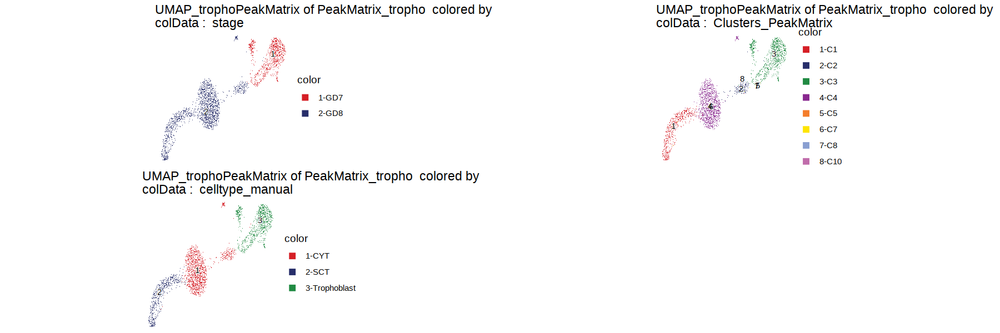

In [12]:
suppressMessages(plot_dim_redu()) 

In [105]:
args$matrix = 'PeakMatrix'
args$ndims <- 25
args$n_neighbors <- 35
args$min_dist <- 0.5
opts$lsi.cluster.resolution = 0.2

ArchRProject = suppressMessages(dim_redu())

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 4903
Number of edges: 211190

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9297
Number of communities: 5
Elapsed time: 0 seconds


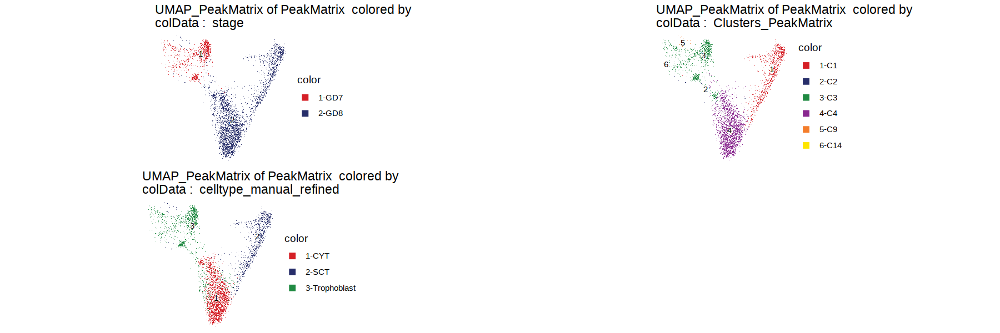

In [58]:
suppressMessages(plot_dim_redu()) 

# Rerun RNA integration with only relevant celltypes

In [23]:
args$matrix = 'PeakMatrix'
addArchRThreads(1)

Setting default number of Parallel threads to 1.



In [24]:
# Load RNA & select only relevant celltypes
io$RNA_in <- file.path(io$basedir,"RNA/RangedSummarizedExperiment.rds")
sceRNA = readRDS(io$RNA_in)

In [25]:
unique(sceRNA@colData$celltype)

[1] "Epiblast"                       "Visceral YS Endoderm"          
 [3] "Trophoblast"                    "Primitive Streak"              
 [5] "Hypoblast"                      "CYT"                           
 [7] "Haematoendothelial progenitors" "Anterior Hypoblast"            
 [9] "Notochord"                      "Placodes"                      
[11] "Neural Crest"                   "Parietal YS Endoderm"          
[13] "Early Amniotic Ectoderm"        "Posterior Mesoderm"            
[15] "Brain/Neural Tube"              "Late Amniotic Ectoderm"        
[17] "Somitic Mesoderm"               "Cranial Mesoderm"              
[19] "NMP"                            "Endothelium"                   
[21] "Limb Ectoderm"                  "Early Erythrocytes"            
[23] "Anterior Mesoderm"              "EXE mesoderm"                  
[25] "SCT"                            "Gut"                           
[27] "YS Mesothelium"                 "Cardiomyocytes"                
[29] "Late Erythrocytes"              "Chorion"                       
[31] "Allantois"                      "Megakaryocytes"                
[33] "Floor Plate"

In [26]:
keep = c('Trophoblast', 'CYT', 'SCT', 'Late Amniotic Ectoderm', 'Early Amniotic Ectoderm', 'Visceral YS Endoderm')
keep = c('Trophoblast', 'CYT', 'SCT')
sceRNA = sceRNA[,sceRNA@colData$celltype %in% keep]

In [27]:
# Add imputation 
ArchRProject <- addImputeWeights(ArchRProject, 
                                reducedDims = args$matrix)

# Integrate
ArchRProject <- addGeneIntegrationMatrix(
    ArchRProj = ArchRProject, 
    useMatrix = "GeneScoreMatrix",
    matrixName = paste0("GeneIntegrationMatrix_", args$matrix),
    reducedDims =  args$matrix,
    seRNA = sceRNA,
    addToArrow = TRUE,
    force= TRUE,
    groupRNA = "celltype",
    nameCell = "predictedCell_Un",
    nameGroup = paste0("Tropho_traj_celltype_", args$matrix),
    nameScore = "predictedScore_celltype")

ArchR logging to : ArchRLogs/ArchR-addImputeWeights-340ff3a86c24c-Date-2022-01-14_Time-11-25-20.log
If there is an issue, please report to github with logFile!

2022-01-14 11:25:20 : Computing Impute Weights Using Magic (Cell 2018), 0 mins elapsed.

Warning message in sprintf("Completed Getting Magic Weights!", round(object.size(weightList)/10^9, :
“one argument not used by format 'Completed Getting Magic Weights!'”
ArchR logging to : ArchRLogs/ArchR-addGeneIntegrationMatrix-340ff7a67dad1-Date-2022-01-14_Time-11-25-30.log
If there is an issue, please report to github with logFile!

2022-01-14 11:25:30 : Running Seurat's Integration Stuart* et al 2019, 0.002 mins elapsed.

Warning message:
“package ‘Seurat’ was built under R version 4.1.2”
2022-01-14 11:25:40 : Checking ATAC Input, 0.16 mins elapsed.

2022-01-14 11:25:40 : Checking RNA Input, 0.16 mins elapsed.

Warning message:
“Non-unique features (rownames) present in the input matrix, making unique”
Warning message:
“Feature names c

In [30]:
suppressMessages(dim_redu())

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 5599
Number of edges: 257564

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8872
Number of communities: 11
Elapsed time: 0 seconds



           ___      .______        ______  __    __  .______      
          /   \     |   _  \      /      ||  |  |  | |   _  \     
         /  ^  \    |  |_)  |    |  ,----'|  |__|  | |  |_)  |    
        /  /_\  \   |      /     |  |     |   __   | |      /     
       /  _____  \  |  |\  \\___ |  `----.|  |  |  | |  |\  \\___.
      /__/     \__\ | _| `._____| \______||__|  |__| | _| `._____|
    



class: ArchRProject 
outputDirectory: /rds/project/rds-SDzz0CATGms/users/bt392/04_Rabbit_ATAC_final/ArchR/Trophoblast 
samples(4): rabbit_BGRGP1 rabbit_BGRGP3 rabbit_BGRGP2 rabbit_BGRGP4
sampleColData names(1): ArrowFiles
cellColData names(44): stage_clusters.3 sample ...
  Tropho_traj_celltype_PeakMatrix Clusters
numberOfCells(1): 5599
medianTSS(1): 3.038
medianFrags(1): 40094

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-340ff408f9b18-Date-2022-01-14_Time-11-34-19.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-340ff408f9b18-Date-2022-01-14_Time-11-34-19.log

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-340ff2b02c066-Date-2022-01-14_Time-11-34-20.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-340ff2b02c066-Date-2022-01-14_Time-11-34-20.log



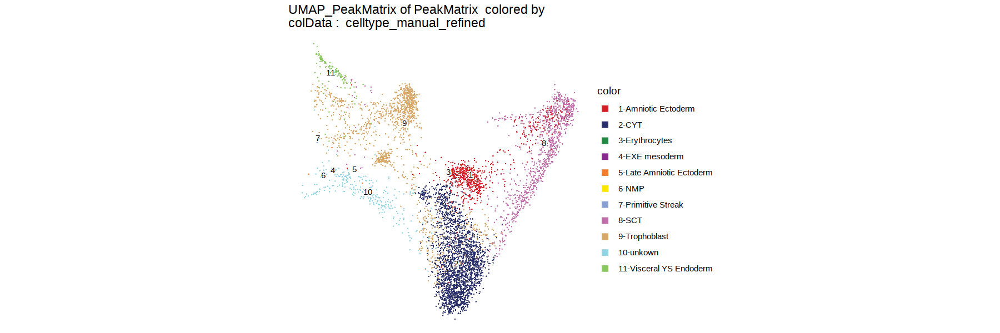

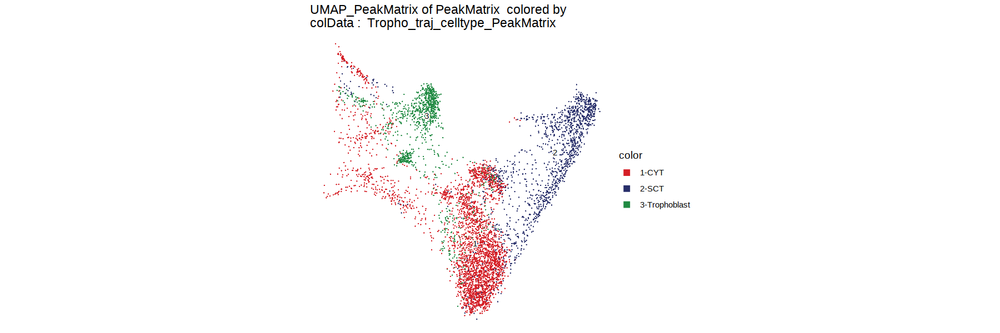

In [31]:
plotEmbedding(ArchRProject, 
              embedding=paste0('UMAP_', args$matrix),
              colorBy = "cellColData", 
            name = "celltype_manual_refined")+ theme_void() + theme(plot.margin=grid::unit(c(0,0,0,0), "mm"))
plotEmbedding(ArchRProject, 
              embedding=paste0('UMAP_', args$matrix),
              colorBy = "cellColData", 
            name = "Tropho_traj_celltype_PeakMatrix")+ theme_void() + theme(plot.margin=grid::unit(c(0,0,0,0), "mm"))

In [11]:
getAvailableMatrices(ArchRProject)

[1] "GeneIntegrationMatrix_PeakMatrix" "GeneIntegrationMatrix_TileMatrix"
[3] "GeneScoreMatrix"                  "MotifMatrix"                     
[5] "PeakMatrix"                       "TileMatrix"

In [14]:
colnames(ArchRProject@cellColData)

[1] "stage_clusters.3"                    
 [2] "sample"                              
 [3] "Sample"                              
 [4] "TSSEnrichment"                       
 [5] "ReadsInTSS"                          
 [6] "ReadsInPromoter"                     
 [7] "PromoterRatio"                       
 [8] "PassQC"                              
 [9] "NucleosomeRatio"                     
[10] "nMultiFrags"                         
[11] "nMonoFrags"                          
[12] "nFrags"                              
[13] "nDiFrags"                            
[14] "DoubletScore"                        
[15] "DoubletEnrichment"                   
[16] "stage"                               
[17] "cell"                                
[18] "stage_mapping"                       
[19] "predictedCell_Un"                    
[20] "predictedGroup_celltype_TileMatrix"  
[21] "predictedScore_celltype"             
[22] "stage_clusters"                      
[23] "cell.1"                              
[24] "Clusters_TileMatrix"                 
[25] "ReadsInPeaks"                        
[26] "FRIP"                                
[27] "predictedCell_Un.1"                  
[28] "predictedGroup_celltype_PeakMatrix"  
[29] "predictedScore_celltype.1"           
[30] "stage_clusters.1"                    
[31] "cell.2"                              
[32] "Clusters_PeakMatrix"                 
[33] "predictedCell_Un.2"                  
[34] "predictedGroup_celltype_TileMatrix.1"
[35] "predictedScore_celltype.2"           
[36] "stage_clusters.2"                    
[37] "cell.3"                              
[38] "predictedCell_Un.3"                  
[39] "predictedGroup_celltype_PeakMatrix.1"
[40] "predictedScore_celltype.3"           
[41] "cell.4"                              
[42] "celltype_manual_refined"

Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-340ff770042df-Date-2022-01-14_Time-11-34-22.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = GeneScoreMatrix

Getting Matrix Values...

2022-01-14 11:34:23 : 

1 
2 
3 
4 


Imputing Matrix

Using weights on disk

1 of 1

Using weights on disk

1 of 1

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-340ff770042df-Date-2022-01-14_Time-11-34-22.log



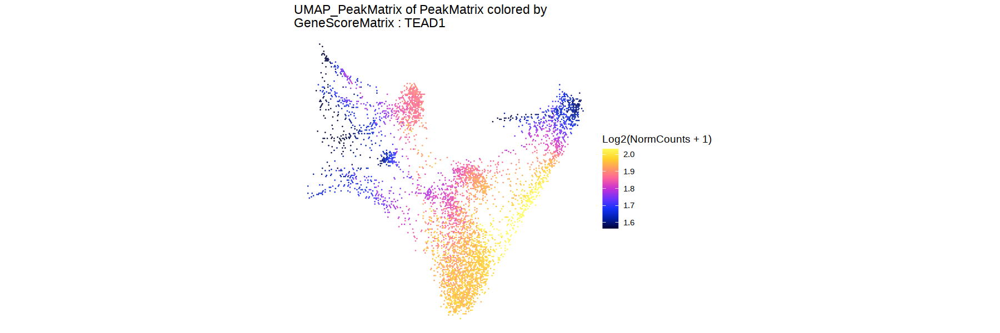

In [32]:
plotEmbedding(ArchRProject, 
              embedding=paste0('UMAP_', args$matrix),
              colorBy = "GeneScoreMatrix", 
            name = "TEAD1")+ theme_void()

# Recalculate peaks

In [28]:
# args
args = list()
args$group_by = 'celltype_manual'
args$pathToMacs2 = findMacs2()
args$pvalue_cutoff = 0.001
args$extend_summits = 300
addArchRThreads(threads = 1) 

Searching For MACS2..

Found with $path!

Setting default number of Parallel threads to 1.



In [29]:
# Add Group Coverages
ArchRProject <- addGroupCoverages(ArchRProject, 
  groupBy = args$group_by,
  useLabels = TRUE,
  minCells = 40,
  maxCells = 500,
  force = TRUE
)

ArchR logging to : ArchRLogs/ArchR-addGroupCoverages-171fd6ec2b4b2-Date-2022-01-21_Time-11-39-03.log
If there is an issue, please report to github with logFile!

CYT (1 of 3) : CellGroups N = 2

SCT (2 of 3) : CellGroups N = 2

Trophoblast (3 of 3) : CellGroups N = 2

2022-01-21 11:39:03 : Creating Coverage Files!, 0.011 mins elapsed.

2022-01-21 11:39:03 : Batch Execution w/ safelapply!, 0.011 mins elapsed.

2022-01-21 11:39:03 : Group CYT._.rabbit_BGRGP2 (1 of 6) : Creating Group Coverage File : CYT._.rabbit_BGRGP2.insertions.coverage.h5, 0.011 mins elapsed.

Number of Cells = 500

Coverage File Exists!

Added Coverage Group

Added Metadata Group

Added ArrowCoverage Class

Added Coverage/Info

Added Coverage/Info/CellNames

2022-01-21 11:39:51 : Group CYT._.rabbit_BGRGP3 (2 of 6) : Creating Group Coverage File : CYT._.rabbit_BGRGP3.insertions.coverage.h5, 0.805 mins elapsed.

Number of Cells = 500

Coverage File Exists!

Added Coverage Group

Added Metadata Group

Added ArrowCoverag

In [30]:
addArchRThreads(threads = 12) 

Setting default number of Parallel threads to 12.



In [31]:
# Call peaks
ArchRProject <- addReproduciblePeakSet(
  ArchRProj = ArchRProject, 
  groupBy = args$group_by, 
  peakMethod = "Macs2",
  excludeChr = c("chrM", "chrY"),
  pathToMacs2 = args$pathToMacs2,
  genomeSize = 2.7e9, # This argument is needed for the non-standard genome
  cutOff = args$pvalue_cutoff,
  extendSummits = args$extend_summits,
  plot = FALSE,
  force = TRUE
)

ArchR logging to : ArchRLogs/ArchR-addReproduciblePeakSet-171fd7fc62ba8-Date-2022-01-21_Time-11-46-31.log
If there is an issue, please report to github with logFile!

Calling Peaks with Macs2

2022-01-21 11:46:31 : Peak Calling Parameters!, 0.006 mins elapsed.



                  Group nCells nCellsUsed nReplicates nMin nMax maxPeaks
CYT                 CYT   1336       1000           2  500  500   150000
SCT                 SCT    570        570           2  268  302   150000
Trophoblast Trophoblast    866        540           2   40  500   150000


2022-01-21 11:46:31 : Batching Peak Calls!, 0.006 mins elapsed.

2022-01-21 11:46:31 : Batch Execution w/ safelapply!, 0 mins elapsed.

2022-01-21 11:49:33 : Identifying Reproducible Peaks!, 3.034 mins elapsed.

2022-01-21 11:50:00 : Creating Union Peak Set!, 3.491 mins elapsed.

Converged after 5 iterations!

2022-01-21 11:50:33 : Finished Creating Union Peak Set (137792)!, 4.04 mins elapsed.



In [32]:
# Add PeakMatrix
ArchRProject <- addPeakMatrix(ArchRProject)

ArchR logging to : ArchRLogs/ArchR-addPeakMatrix-171fd68c14cf7-Date-2022-01-21_Time-11-50-33.log
If there is an issue, please report to github with logFile!

2022-01-21 11:50:33 : Batch Execution w/ safelapply!, 0 mins elapsed.

Overriding previous entry for ReadsInPeaks

Overriding previous entry for FRIP

ArchR logging successful to : ArchRLogs/ArchR-addPeakMatrix-171fd68c14cf7-Date-2022-01-21_Time-11-50-33.log



In [37]:
args = list()
args$nfeatures <- 15000
args$matrix <- 'PeakMatrix'
args$ndims <- 35
args$n_neighbors <- 45
args$min_dist <- 0.3
args$seed <- 42

# Options
opts$lsi.iterations = 2
opts$lsi.cluster.resolution = 0.5

In [39]:
# Iterative LSI: two iterations
ArchRProject <- addIterativeLSI(
  ArchRProj = ArchRProject,
  useMatrix = args$matrix, 
  name = paste0(args$matrix, '_tropho'), 
  dimsToUse = 1:args$ndims,
  firstSelection = "Top",
  depthCol = "nFrags",
  iterations = opts$lsi.iterations, 
  saveIterations = FALSE,
  varFeatures = args$nfeatures, 
  force = TRUE
)

ArchRProject <- addUMAP(
  ArchRProj = ArchRProject, 
  reducedDims = paste0(args$matrix, '_tropho'),
  name = paste0("UMAP_tropho", args$matrix),
  metric = "cosine",
  nNeighbors = args$n_neighbors, 
  minDist = args$min_dist, 
  seed = args$seed,
  saveModel = FALSE,
  force = TRUE)

Checking Inputs...

ArchR logging to : ArchRLogs/ArchR-addIterativeLSI-171fd2dc7cbd6-Date-2022-01-21_Time-11-55-20.log
If there is an issue, please report to github with logFile!

2022-01-21 11:55:21 : Computing Total Across All Features, 0.005 mins elapsed.

2022-01-21 11:55:22 : Computing Top Features, 0.022 mins elapsed.

###########
2022-01-21 11:55:23 : Running LSI (1 of 2) on Top Features, 0.045 mins elapsed.
###########

2022-01-21 11:55:23 : Creating Partial Matrix, 0.045 mins elapsed.

2022-01-21 11:55:28 : Computing LSI, 0.126 mins elapsed.

2022-01-21 11:55:42 : Identifying Clusters, 0.358 mins elapsed.

2022-01-21 11:55:47 : Identified 6 Clusters, 0.438 mins elapsed.

2022-01-21 11:55:47 : Creating Cluster Matrix on the total Group Features, 0.438 mins elapsed.

2022-01-21 11:55:56 : Computing Variable Features, 0.595 mins elapsed.

###########
2022-01-21 11:55:56 : Running LSI (2 of 2) on Variable Features, 0.596 mins elapsed.
###########

2022-01-21 11:55:56 : Creating Pa

In [42]:
plot_dim_redu = function(){
p1 = plotEmbedding(ArchRProject, 
              embedding=paste0("UMAP_tropho", args$matrix),
              colorBy = "cellColData", 
            name = "stage")+ theme_void() + theme(plot.margin=grid::unit(c(0,0,0,0), "mm"))

p2 = plotEmbedding(ArchRProject, 
              embedding=paste0("UMAP_tropho", args$matrix),
              colorBy = "cellColData", 
            name = "predictedGroup_celltype_PeakMatrix")+ theme_void() + theme(plot.margin=grid::unit(c(0,0,0,0), "mm"))

p3 = plotEmbedding(ArchRProject, 
              embedding=paste0("UMAP_tropho", args$matrix),
              colorBy = "cellColData", 
            name = "celltype_manual")+ theme_void() + theme(plot.margin=grid::unit(c(0,0,0,0), "mm"))

ggarrange(p1, p2, p3)
}

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-171fd116ede67-Date-2022-01-21_Time-11-57-29.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-171fd116ede67-Date-2022-01-21_Time-11-57-29.log

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-171fd32d4cbdc-Date-2022-01-21_Time-11-57-29.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-171fd32d4cbdc-Date-2022-01-21_Time-11-57-29.log

ArchR logging to : ArchRLogs/ArchR-plotEmbedding-171fd71d89bae-Date-2022-01-21_Time-11-57-30.log
If there is an issue, please report to github with logFile!

Getting UMAP Embedding

ColorBy = cellColData

Plotting Embedding

1 


ArchR logging successful to : ArchRLogs/ArchR-plotEmbedding-171fd71d89bae-Date-2022-01-21_Ti

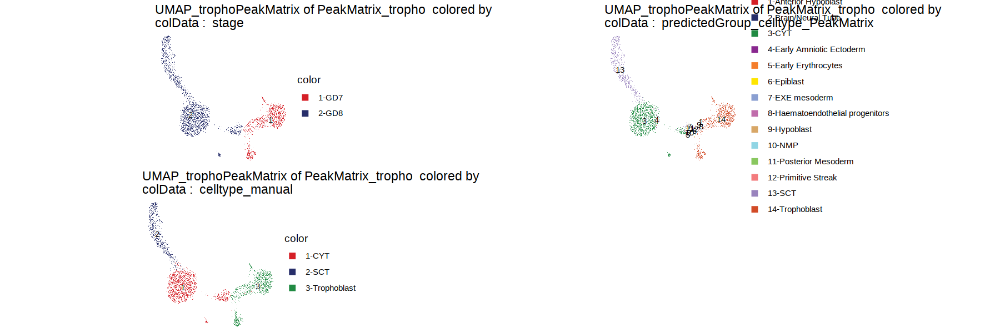

In [43]:
plot_dim_redu()

In [52]:
trajectory <- c("Trophoblast", "CYT", "SCT")

In [57]:
ArchRProject <- addTrajectory(
    ArchRProj = ArchRProject, 
    name = "Tropho", 
    groupBy = "celltype_manual",
    trajectory = trajectory, 
    #reducedDims = "PeakMatrix_tropho", 
    embedding = "UMAP_trophoPeakMatrix",
    force = TRUE
)

ArchR logging to : ArchRLogs/ArchR-addTrajectory-171fd45f4bd17-Date-2022-01-21_Time-12-07-27.log
If there is an issue, please report to github with logFile!

Filtering outliers

Initial Alignment Before Spline Fit

Spline Fit

KNN to Spline

Overriding previous entry for Tropho

ArchR logging successful to : ArchRLogs/ArchR-addTrajectory-171fd45f4bd17-Date-2022-01-21_Time-12-07-27.log



ArchR logging to : ArchRLogs/ArchR-plotTrajectory-171fd6a13862c-Date-2022-01-21_Time-12-07-27.log
If there is an issue, please report to github with logFile!

Plotting

Warning message:
“Removed 278 rows containing non-finite values (stat_summary_hex).”
Plotting Trajectory

Adding Inferred Arrow Trajectory to Plot

ArchR logging successful to : ArchRLogs/ArchR-plotTrajectory-171fd6a13862c-Date-2022-01-21_Time-12-07-27.log

Warning message:
“Removed 278 rows containing non-finite values (stat_summary_hex).”


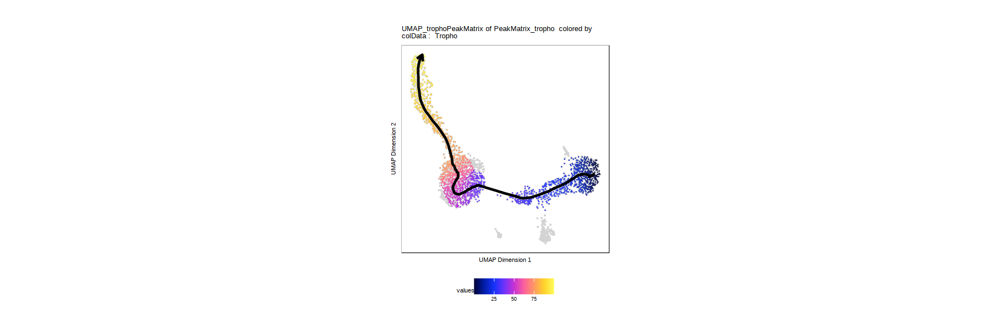

In [58]:
p <- plotTrajectory(ArchRProject, trajectory = "Tropho", colorBy = "cellColData", name = "Tropho", embedding = "UMAP_trophoPeakMatrix")
p[[1]]

In [55]:
ArchRProject = addImputeWeights(ArchRProject,reducedDims='PeakMatrix_tropho')

ArchR logging to : ArchRLogs/ArchR-addImputeWeights-171fd13861e6c-Date-2022-01-21_Time-12-05-45.log
If there is an issue, please report to github with logFile!

2022-01-21 12:05:45 : Computing Impute Weights Using Magic (Cell 2018), 0 mins elapsed.

Warning message in sprintf("Completed Getting Magic Weights!", round(object.size(weightList)/10^9, :
“one argument not used by format 'Completed Getting Magic Weights!'”


Getting ImputeWeights

ArchR logging to : ArchRLogs/ArchR-plotTrajectory-171fd36f086ce-Date-2022-01-21_Time-12-07-31.log
If there is an issue, please report to github with logFile!

Getting Matrix Values...

2022-01-21 12:07:32 : 



Imputing Matrix

Using weights on disk

1 of 1

Plotting

Warning message:
“Removed 278 rows containing non-finite values (stat_summary_hex).”
Plotting Trajectory

Adding Inferred Arrow Trajectory to Plot

ArchR logging successful to : ArchRLogs/ArchR-plotTrajectory-171fd36f086ce-Date-2022-01-21_Time-12-07-31.log

Warning message:
“Removed 278 rows containing non-finite values (stat_summary_hex).”
`geom_smooth()` using method = 'gam' and formula 'y ~ s(x, bs = "cs")'



[[1]]

[[2]]


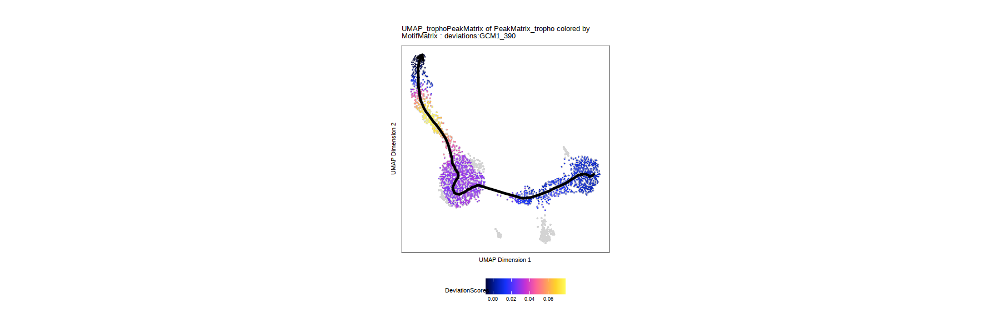

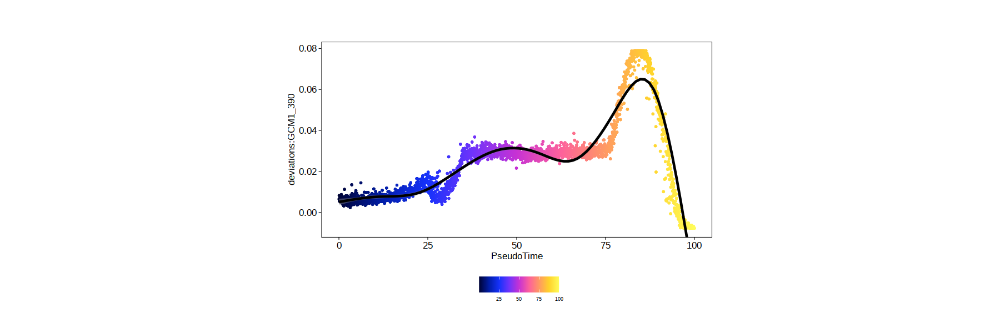

In [59]:
p = plotTrajectory(ArchRProject, 
                   trajectory = "Tropho", 
                   colorBy = "MotifMatrix", 
                   name = 'deviations:GCM1_390', 
                   continuousSet = "horizonExtra", 
                   embedding = "UMAP_trophoPeakMatrix")
p